# Data Preparation

In [ ]:
# !pip install seaborn
# !pip install nltk
# !pip install torch
# !pip install scikit-learn
# !pip install tensorflow
# !pip install numpy
# !pip install transformers
# !pip install gensim
# !pip install tf-keras

In [ ]:
import os
import json
import pandas as pd
import re
import string
import random
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import joblib
import matplotlib.pyplot as plt

## Load & Filter Business Data

In [ ]:
# Set dataset path, filter for Pennsylvania businesses, and limit to 120,000 samples
dataset_folder = "yelp_dataset"
business_path = os.path.join(dataset_folder, "yelp_academic_dataset_business.json")
target_states = ["PA"]
total_samples = 120000

# Load business data
print("Loading business data...")
with open(business_path, 'r', encoding='utf-8') as f:
    business_df = pd.DataFrame([json.loads(line) for line in f])
print("Total businesses loaded:", len(business_df))

# View the summary of all states
restaurant_mask = business_df['categories'].notna() & business_df['categories'].str.contains("Restaurant", case=False)
restaurant_businesses = business_df[restaurant_mask]

state_summary = (
    restaurant_businesses
    .groupby("state")
    .agg(num_restaurants=("business_id", "count"),
         total_reviews=("review_count", "sum"))
    .sort_values("total_reviews", ascending=False)
)

print("Top 10 states with the most restaurant reviews:")
print(state_summary.head(10))

# Filter only restaurants in the target state
is_target_state = business_df['state'].isin(target_states)
filtered_business_df = business_df[restaurant_mask & is_target_state]
restaurant_ids = set(filtered_business_df['business_id'])

print(f"\nSelected state: {target_states[0]}")
print(f"Filtered restaurant businesses in {target_states[0]}:", len(filtered_business_df))


Loading business data...
Total businesses loaded: 150346
Top 10 states with the most restaurant reviews:
       num_restaurants  total_reviews
state                                
PA               12644        1060931
FL                8732         763845
LA                3641         544968
TN                4353         423761
MO                4248         341278
IN                4150         323905
AZ                2675         255387
NV                1675         232090
CA                1161         206222
NJ                3343         163712

Selected state: PA
Filtered restaurant businesses in PA: 12644


In [ ]:
filtered_business_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
15,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,205 Race St,Philadelphia,PA,19106,39.953949,-75.143226,4.0,245,1,"{'RestaurantsReservations': 'True', 'Restauran...","Sushi Bars, Restaurants, Japanese","{'Tuesday': '13:30-22:0', 'Wednesday': '13:30-..."
19,ROeacJQwBeh05Rqg7F6TCg,BAP,1224 South St,Philadelphia,PA,19147,39.943223,-75.162568,4.5,205,1,"{'NoiseLevel': 'u'quiet'', 'GoodForMeal': '{'d...","Korean, Restaurants","{'Monday': '11:30-20:30', 'Tuesday': '11:30-20..."
28,QdN72BWoyFypdGJhhI5r7g,Bar One,767 S 9th St,Philadelphia,PA,19147,39.939825,-75.157447,4.0,65,0,"{'Smoking': 'u'no'', 'NoiseLevel': 'u'average'...","Cocktail Bars, Bars, Italian, Nightlife, Resta...","{'Monday': '16:0-0:0', 'Tuesday': '16:0-0:0', ..."
31,Mjboz24M9NlBeiOJKLEd_Q,DeSandro on Main,4105 Main St,Philadelphia,PA,19127,40.022466,-75.218314,3.0,41,0,"{'RestaurantsReservations': 'False', 'Caters':...","Pizza, Restaurants, Salad, Soup","{'Tuesday': '17:0-21:30', 'Wednesday': '17:0-1..."


##  Load & Filter Review Data

In [ ]:
# Load & filter review data
review_path = os.path.join(dataset_folder, "yelp_academic_dataset_review.json")

print("Loading and filtering review data...")
filtered_reviews = []

with open(review_path, 'r', encoding='utf-8') as f:
    for line in f:
        obj = json.loads(line)
        if obj['business_id'] in restaurant_ids:
            filtered_reviews.append(obj)

review_df = pd.DataFrame(filtered_reviews)
review_df.rename(columns={'stars': 'stars_r'}, inplace=True)

print("Total filtered reviews:", len(review_df))


Loading and filtering review data...
Total filtered reviews: 1100276


## Merge data and Create New Dataset For Analysis

In [ ]:
# Merge review + business info
restaurant_df = pd.merge(review_df, filtered_business_df, on="business_id", how="left")

random_seed = 42

# Filter valid ratings (1 to 5)
restaurant_df = restaurant_df[restaurant_df['stars_r'].isin([1, 2, 3, 4, 5])]

# Assign string-based binary sentiment
def map_sentiment_binary_label(stars):
    if stars in [1, 2, 3]:
        return "negative"
    else:  # 4 or 5
        return "positive"

restaurant_df['sentiment'] = restaurant_df['stars_r'].apply(map_sentiment_binary_label)

# Stratified sampling using string labels
samples_per_class = total_samples // 2

sampled_binary_list = []
for sentiment_label in ['negative', 'positive']:
    subset = restaurant_df[restaurant_df['sentiment'] == sentiment_label]
    if len(subset) < samples_per_class:
        print(f"Warning: Not enough samples for '{sentiment_label}'. Available: {len(subset)}")
        sampled = subset
    else:
        sampled = subset.sample(n=samples_per_class, random_state=random_seed)
    sampled_binary_list.append(sampled)

# Combine and reset index
restaurant_binary_df = pd.concat(sampled_binary_list).reset_index(drop=True)

# Summary
print("Final binary sentiment dataset:", len(restaurant_binary_df))
print("Binary sentiment distribution:")
print(restaurant_binary_df['sentiment'].value_counts())

# Save CSV
output_file = f"yelp_binary_sentiment_{target_states[0]}_{total_samples}.csv"
restaurant_binary_df.to_csv(output_file, index=False)
print(f"Saved to {output_file}")


Final binary sentiment dataset: 120000
Binary sentiment distribution:
sentiment
negative    60000
positive    60000
Name: count, dtype: int64
Saved to yelp_binary_sentiment_PA_120000.csv


# Load New Dataset For Analysis

In [ ]:
# set display options if needed
pd.set_option('display.max_colwidth', 200)

# load the labeled sentiment dataset
file_path = "yelp_binary_sentiment_PA_120000.csv"
df = pd.read_csv(file_path)

# check sentiment distribution
print("\nSentiment class distribution:")
print(df['sentiment'].value_counts())




Sentiment class distribution:
sentiment
negative    60000
positive    60000
Name: count, dtype: int64


In [ ]:
df.head()

,review_id,user_id,business_id,stars_r,useful,funny,cool,text,date,name,...,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,sentiment
0,w6_mekPbjmN3A73uBWHYaQ,e_CAc7b6we3XZffB2PaDUQ,WGfnSTCWAzk1xqtkJVB7RA,3.0,1,0,0,"I've been on a sushi spree lately. Have about 10 sushi groupons, living socials, and so forth stored up and I have finally been using them to get a good objective dose of what Philly has to offer ...",2012-06-07 04:15:29,Sushi Planet,...,19147.0,39.940723,-75.147974,3.5,192,1,"{'RestaurantsPriceRange2': '2', 'BikeParking': 'True', 'RestaurantsDelivery': 'True', 'BusinessAcceptsCreditCards': 'True', 'BusinessParking': ""{'garage': False, 'street': True, 'validated': False...","Japanese, Restaurants, Sushi Bars","{'Monday': '16:0-21:30', 'Tuesday': '16:0-21:30', 'Wednesday': '12:0-21:30', 'Thursday': '12:0-21:30', 'Friday': '12:0-22:30', 'Saturday': '17:0-22:0', 'Sunday': '16:0-21:30'}",negative
1,TbLocjj7MqJeWsgmbyYYuw,aEaZGRATp6X9TvVMCeYVRA,AfM_dYO_LTqQz33qHbT45A,1.0,0,0,0,I was sooo excited to see a Mamouns coming to Philadelphia. My excitement was quickly shattered when I opted to grab my favorite falafel on a Saturday night after some libations only to find yo...,2018-11-30 14:14:18,"Mamoun's Falafel - Philadelphia, PA",...,19106.0,39.950037,-75.145843,4.0,96,0,"{'Alcohol': ""u'none'"", 'DriveThru': 'False', 'BusinessAcceptsCreditCards': 'True', 'GoodForKids': 'True', 'OutdoorSeating': 'True', 'RestaurantsTableService': 'False', 'RestaurantsAttire': ""u'casu...","Middle Eastern, Food, Greek, Restaurants, Vegan, Falafel, Caterers, Fast Food, Mediterranean, Event Planning & Services, Sandwiches","{'Monday': '0:0-0:0', 'Tuesday': '11:0-22:0', 'Wednesday': '11:0-22:0', 'Thursday': '11:0-22:0', 'Friday': '11:0-22:0', 'Saturday': '11:0-22:0', 'Sunday': '11:0-15:30'}",negative
2,ViTppgPDymsuX1s0r9ngag,Qxx4Upyd_ZYO1omUDaVKmQ,HuDNHqKv9n1mWpe4BqCnwA,2.0,1,0,0,Went there to grab a sandwich. New Newton area and tried it. Food is ok. Staff is shady. Didn't talk to you much or smile. I felt like I was an inconvenience to them. Never again.,2015-07-20 01:22:50,Minas Pizza,...,19128.0,40.035235,-75.216793,3.0,54,1,"{'BikeParking': 'False', 'Ambience': ""{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True...","Restaurants, Pizza","{'Monday': '0:0-0:0', 'Tuesday': '11:0-21:45', 'Wednesday': '11:0-21:45', 'Thursday': '11:0-21:45', 'Friday': '11:0-21:45', 'Saturday': '11:0-21:45', 'Sunday': '12:0-20:30'}",negative
3,KQ5UKjuzftUBrAbR-O5EeQ,BGJGlTZOzI8sp4ufCG0hmQ,RnhLCG4N9MPy6ZRzq787Cg,1.0,0,0,0,"I never felt the need to write a review until now. While this place has some decent reviews, their service says otherwise.\n\nWe came in for brunch and they were extremely busy. We were seated and...",2016-02-22 17:05:07,Devil's Alley Bar & Grille,...,19103.0,39.952140,-75.172216,3.5,825,1,"{'Corkage': 'False', 'GoodForKids': 'False', 'HasTV': 'True', 'RestaurantsPriceRange2': '2', 'BusinessAcceptsCreditCards': 'True', 'Caters': 'False', 'BusinessParking': ""{'garage': False, 'street'...","Local Flavor, Nightlife, Bars, American (New), Restaurants, Breakfast & Brunch, Sports Bars, Pubs","{'Monday': '11:30-21:0', 'Tuesday': '11:30-21:0', 'Wednesday': '11:30-21:0', 'Thursday': '11:30-22:0', 'Friday': '11:30-22:0', 'Saturday': '11:0-22:0', 'Sunday': '11:0-0:0'}",negative
4,acuAnBOLf6fRHZmBMHY2FA,-MeResg7zWIywg7JwuMvaw,d_tRshM-w6S4QxE4VVi8tQ,1.0,2,1,1,This had to be the worst restaurant experience I ever had. The server was awful in fact seemed beyond confused. The drinks never came out we had to ask for them after the meal arrived and it still...,2015-06-28 13:14:54,Jones,...,19106.0,39.949314,-75.152525,3.5,1141,0,"{'BusinessAcceptsCreditCards': 'True', 'RestaurantsTakeOut': 'True', 'RestaurantsGoodForGroups': 'True', 'RestaurantsAttire': ""'casual'"", 'OutdoorSeating': 'False', 'GoodForKids': 'True',

## Meta Features


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from collections import Counter

def meta_features(
    df,
    top_n_categories=50,
    corr_threshold=0.05,
    full_save_path="meta_features_processed.csv",
    filtered_save_path="meta_features_filtered.csv"
):
    # Convert date to UNIX timestamp
    df['date_unix'] = pd.to_datetime(df['date'], errors='coerce').astype('int64') // 10**9

    # Extract top-N restaurant categories
    df['category_list'] = df['categories'].fillna('').apply(lambda x: x.split(', '))
    all_categories = [cat for sublist in df['category_list'] for cat in sublist]
    top_categories = [cat for cat, _ in Counter(all_categories).most_common(top_n_categories)]

    # Create binary category features
    for category in top_categories:
        df[f'cat_{category}'] = df['category_list'].apply(lambda x: int(category in x))

    # Select base + category meta features
    base_meta = ['useful', 'funny', 'cool', 'review_count', 'is_open', 'date_unix']
    category_meta = [f'cat_{cat}' for cat in top_categories]
    all_meta_features = base_meta + category_meta

    print(f"\n Total initial meta features: {len(all_meta_features)}")

    # Min-Max Scaling
    meta_combined = df[all_meta_features].copy()
    scaler = MinMaxScaler()
    meta_scaled = pd.DataFrame( scaler.fit_transform(meta_combined),columns=meta_combined.columns, index=meta_combined.index)

    # Save unfiltered (full) meta
    meta_scaled.to_csv(full_save_path, index=True)

    # Correlation with binary sentiment (positive=1, negative=0)
    sentiment_numeric = df['sentiment'].map({'negative': 0, 'positive': 1})
    meta_scaled['sentiment'] = sentiment_numeric
    correlations = meta_scaled.corr(method='pearson')['sentiment'].drop('sentiment')
    sorted_corr = correlations.sort_values(key=abs, ascending=False)

    # Feature selection by threshold
    selected_features = sorted_corr[sorted_corr.abs() > corr_threshold].index.tolist()
    selected_corr = sorted_corr[selected_features]


    print("\nMeta Feature Summary:")
    print(f"- Features selected with |corr| > {corr_threshold}: {len(selected_features)}\n")

    print("Selected Features and their Correlation with Sentiment:")
    print(selected_corr.to_string())  # neatly aligned output

    # Save filtered meta features
    filtered_meta = meta_scaled[selected_features]
    filtered_meta.to_csv(filtered_save_path, index=True)
    print(f"\nFiltered meta features saved to: {filtered_save_path}")

    return meta_scaled, filtered_meta, selected_features

meta_scaled, filtered_meta, selected_features = meta_features(df)



 Total initial meta features: 56

Meta Feature Summary:
- Features selected with |corr| > 0.05: 10

Selected Features and their Correlation with Sentiment:
review_count                  0.083107
cool                          0.077625
cat_American (Traditional)   -0.065670
funny                        -0.060946
cat_Sports Bars              -0.060845
cat_Fast Food                -0.060665
is_open                       0.055788
cat_Burgers                  -0.055577
cat_Specialty Food            0.053979
cat_Cafes                     0.052376

Filtered meta features saved to: meta_features_filtered.csv


## Data Preprocessing

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from transformers import BertTokenizer
from tqdm import tqdm
tqdm.pandas()
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.download('punkt_tab')

# Setup preprocessing tools
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Define preprocessing functions
def preprocess_ML_process(text):
    text = text.lower()                                             # Convert to lowercase
    text = re.sub(r'\s+', ' ', text)                                # Normalize whitespace
    text = re.sub(f"[{re.escape(string.punctuation)}]", '', text)   # Remove all punctuation
    tokens = word_tokenize(text)                                    # Tokenize into words
    tokens = [lemmatizer.lemmatize(w) for w in tokens]              # Lemmatize each token
    return ' '.join(tokens)


# Define preprocessing function for DL models (BERT etc.)
def preprocess_DL_process(text):
    text = text.strip()                 # Remove leading and trailing whitespace
    text = re.sub(r'\s+', ' ', text)    # Normalize internal whitespace
    return text

# Tokenization and lemmatization for EDA or manual analysis
def clean_and_tokenize(text):
    tokens = word_tokenize(text.lower())  # Lowercase and tokenize
    lemmatized = [lemmatizer.lemmatize(word) for word in tokens]  # Lemmatize tokens
    return lemmatized

# Create a working copy of the dataframe
df_cleaned = df.copy()

# Apply preprocessing functions
df_cleaned['clean_text_ML'] = df_cleaned['text'].progress_apply(preprocess_ML_process)
df_cleaned['clean_text_DL'] = df_cleaned['text'].progress_apply(preprocess_DL_process)
df_cleaned['tokens'] = df_cleaned['text'].progress_apply(clean_and_tokenize)


df_cleaned.to_csv("yelp_preprocessed.csv", index=False)
print("Preprocessed data saved to 'yelp_preprocessed.csv'")


100%|██████████| 120000/120000 [00:48<00:00, 2455.13it/s]


Preprocessed data saved to 'yelp_preprocessed.csv'


## Split Data to Training, Validation and Test

In [ ]:
from sklearn.model_selection import train_test_split

# Set random seed
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Stratified split: 60% train, 20% val, 20% test
train_df, temp_df = train_test_split(df_cleaned, test_size=0.4, stratify=df_cleaned['sentiment'], random_state=RANDOM_SEED)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['sentiment'], random_state=RANDOM_SEED)

# Label
y_train = train_df['sentiment'].values
y_val   = val_df['sentiment'].values
y_test  = test_df['sentiment'].values

# For BERT model – clean_text_DL format
X_train_bert = train_df['clean_text_DL']
X_val_bert   = val_df['clean_text_DL']
X_test_bert  = test_df['clean_text_DL']


## Create TF-IDF and Meta Features

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse import hstack, csr_matrix

# TF-IDF Vectorization
tfidf = TfidfVectorizer(max_features=5000, stop_words='english')
tfidf.fit(df_cleaned['clean_text_ML'])

X_text_train = tfidf.transform(train_df['clean_text_ML'])
X_text_val   = tfidf.transform(val_df['clean_text_ML'])
X_text_test  = tfidf.transform(test_df['clean_text_ML'])

# Load filtered meta features (already scaled and selected)
filtered_meta = pd.read_csv("meta_features_filtered.csv", index_col=0)

# Match rows with train/val/test splits using index from df_cleaned
X_meta_train = csr_matrix(filtered_meta.loc[train_df.index].values)
X_meta_val   = csr_matrix(filtered_meta.loc[val_df.index].values)
X_meta_test  = csr_matrix(filtered_meta.loc[test_df.index].values)

# Combine TF-IDF + Filtered Meta Features
X_combined_train = hstack([X_text_train, X_meta_train])
X_combined_val   = hstack([X_text_val, X_meta_val])
X_combined_test  = hstack([X_text_test, X_meta_test])


## Train and Evaluate Model with Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time

def run_randomized_model_precombined(name, model, param_dist, X_train, y_train, X_val, y_val, n_iter=10, label_encoder=None):
    print(f"\n- {name} -")

    # RandomizedSearchCV directly on the model
    search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_dist,
        n_iter=n_iter,
        cv=3,
        scoring='accuracy',
        n_jobs=-1,
        random_state=42
    )

    # Start training
    start_time = time.time()
    search.fit(X_train, y_train)
    training_time = time.time() - start_time

    # Predict on train and val
    y_train_pred = search.predict(X_train)
    y_val_pred = search.predict(X_val)

    # Decode labels if encoded
    if label_encoder:
        y_train_true = label_encoder.inverse_transform(y_train)
        y_val_true = label_encoder.inverse_transform(y_val)
        y_train_pred = label_encoder.inverse_transform(y_train_pred)
        y_val_pred = label_encoder.inverse_transform(y_val_pred)
    else:
        y_train_true = y_train
        y_val_true = y_val

    # Report
    print("Training Accuracy:", accuracy_score(y_train_true, y_train_pred))
    print("Training Classification Report:")
    print(classification_report(y_train_true, y_train_pred))

    print("\nValidation Accuracy:", accuracy_score(y_val_true, y_val_pred))
    print("Validation Classification Report:")
    print(classification_report(y_val_true, y_val_pred))

    print("Best Parameters:", search.best_params_)
    print("Best Cross-Validation Accuracy:", search.best_score_)
    print(f"Training Time: {training_time:.2f} seconds")

    # Confusion Matrix
    print("\nConfusion Matrix (Validation Set):")
    cm = confusion_matrix(y_val_true, y_val_pred)
    labels = label_encoder.classes_ if label_encoder else sorted(set(y_val_true))
    df_cm = pd.DataFrame(cm, index=labels, columns=labels)
    print(df_cm)

    plt.figure(figsize=(6, 4))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

    return search


## Naive Bayes

### 1. Meta Feature + Naive Bayes


- Naive Bayes (Meta Only, GaussianNB) -
Training Accuracy: 0.5699583333333333
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.58      0.48      0.53     36000
    positive       0.56      0.66      0.60     36000

    accuracy                           0.57     72000
   macro avg       0.57      0.57      0.57     72000
weighted avg       0.57      0.57      0.57     72000


Validation Accuracy: 0.5713333333333334
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.59      0.48      0.53     12000
    positive       0.56      0.66      0.61     12000

    accuracy                           0.57     24000
   macro avg       0.57      0.57      0.57     24000
weighted avg       0.57      0.57      0.57     24000

Best Parameters: {}
Best Cross-Validation Accuracy: 0.5745555555555555
Training Time: 2.86 seconds

Confusion Matrix (Validation Set):
          negative  posit

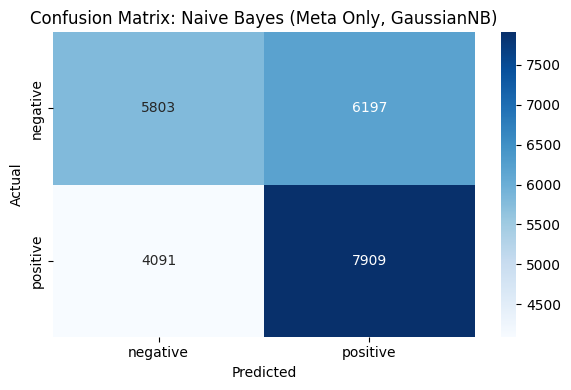

In [ ]:
from sklearn.naive_bayes import GaussianNB

# GaussianNB doesn't accept sparse input → convert to dense
X_meta_train_dense = X_meta_train.toarray()
X_meta_val_dense   = X_meta_val.toarray()

nb_model_meta = run_randomized_model_precombined(
    name="Naive Bayes (Meta Only, GaussianNB)",
    model=GaussianNB(),
    param_dist={},
    X_train=X_meta_train_dense,
    y_train=y_train,
    X_val=X_meta_val_dense,
    y_val=y_val,
    n_iter=1
)


### 2. TF IDF + Naive Bayes


- Naive Bayes (TF-IDF Only) -
Training Accuracy: 0.8590277777777777
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.83      0.85     36000
    positive       0.84      0.89      0.86     36000

    accuracy                           0.86     72000
   macro avg       0.86      0.86      0.86     72000
weighted avg       0.86      0.86      0.86     72000


Validation Accuracy: 0.850375
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.82      0.85     12000
    positive       0.83      0.88      0.86     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000

Best Parameters: {'alpha': 1.0}
Best Cross-Validation Accuracy: 0.8528888888888889
Training Time: 1.28 seconds

Confusion Matrix (Validation Set):
          negative  positive
nega

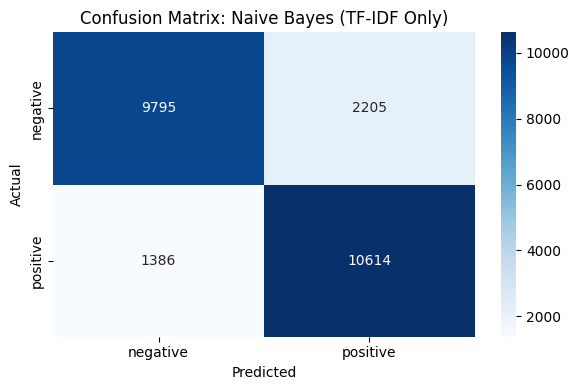

In [ ]:
from sklearn.naive_bayes import MultinomialNB

nb_param_dist = {'alpha': [0.1, 0.5, 1.0]}

nb_model = run_randomized_model_precombined(
    name="Naive Bayes (TF-IDF Only)",
    model=MultinomialNB(),
    param_dist=nb_param_dist,
    X_train=X_text_train,
    y_train=y_train,
    X_val=X_text_val,
    y_val=y_val,
    n_iter=3
)

### 3. (TF IDF + Meta Features) + Naive Bayes


- Naive Bayes (TF-IDF + Meta) -
Training Accuracy: 0.8531527777777778
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.82      0.85     36000
    positive       0.83      0.88      0.86     36000

    accuracy                           0.85     72000
   macro avg       0.85      0.85      0.85     72000
weighted avg       0.85      0.85      0.85     72000


Validation Accuracy: 0.8450416666666667
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.81      0.84     12000
    positive       0.82      0.88      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.84     24000
weighted avg       0.85      0.85      0.84     24000

Best Parameters: {'alpha': 0.5}
Best Cross-Validation Accuracy: 0.8463750000000001
Training Time: 1.21 seconds

Confusion Matrix (Validation Set):
          negative  p

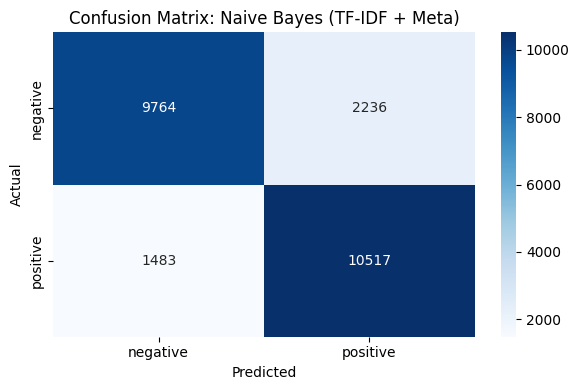

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

nb_param_dist = {'alpha': [0.1, 0.5, 1.0]}

nb_model_combined = run_randomized_model_precombined(
    name="Naive Bayes (TF-IDF + Meta)",
    model=MultinomialNB(),
    param_dist=nb_param_dist,
    X_train=X_combined_train,
    y_train=y_train,
    X_val=X_combined_val,
    y_val=y_val,
    n_iter=3
)


## Logistic Regression

### 1. Meta Features + Logitic Regression


- Logistic Regression (Meta Only) -
Training Accuracy: 0.5970833333333333
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.52      0.56     36000
    positive       0.58      0.68      0.63     36000

    accuracy                           0.60     72000
   macro avg       0.60      0.60      0.59     72000
weighted avg       0.60      0.60      0.59     72000


Validation Accuracy: 0.598875
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.52      0.57     12000
    positive       0.59      0.68      0.63     12000

    accuracy                           0.60     24000
   macro avg       0.60      0.60      0.60     24000
weighted avg       0.60      0.60      0.60     24000

Best Parameters: {'C': 10}
Best Cross-Validation Accuracy: 0.5967361111111111
Training Time: 0.98 seconds

Confusion Matrix (Validation Set):
          negative  positive
neg

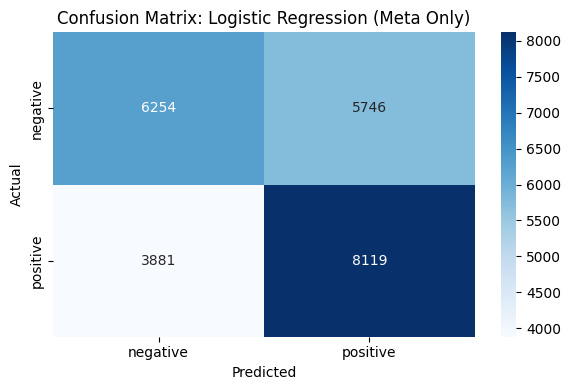

In [ ]:
from sklearn.linear_model import LogisticRegression

# Convert meta features to dense matrix
X_meta_train_dense = X_meta_train.toarray()
X_meta_val_dense   = X_meta_val.toarray()

lr_param_dist_meta = {'C': [0.1, 1, 10]}

lr_model_meta = run_randomized_model_precombined(
    name="Logistic Regression (Meta Only)",
    model=LogisticRegression(
        class_weight='balanced',
        solver='saga',
        max_iter=500,
        n_jobs=-1,
        random_state=42
    ),
    param_dist=lr_param_dist_meta,
    X_train=X_meta_train_dense,
    y_train=y_train,
    X_val=X_meta_val_dense,
    y_val=y_val,
    n_iter=3
)


### 2. TF IDF + Logistic Regression


- Logistic Regression (TF-IDF Only) -
Training Accuracy: 0.895625
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.89     36000
    positive       0.89      0.90      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.8752083333333334
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.87     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000

Best Parameters: {'C': 1}
Best Cross-Validation Accuracy: 0.8785138888888889
Training Time: 2.30 seconds

Confusion Matrix (Validation Set):
          negative  positive
ne

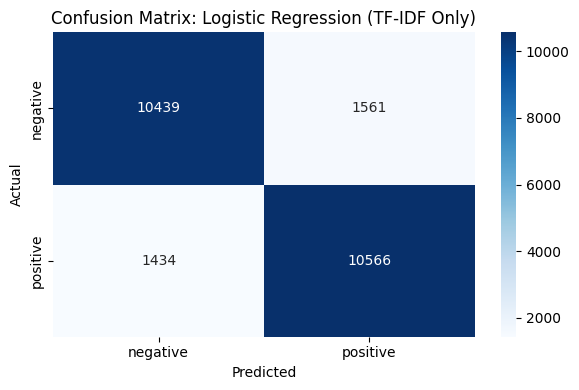

In [ ]:
from sklearn.linear_model import LogisticRegression

# Hyperparameter grid for TF-IDF only
lr_param_dist_text = {'C': [0.1, 1, 10]}

lr_model_text = run_randomized_model_precombined(
    name="Logistic Regression (TF-IDF Only)",
    model=LogisticRegression(
        class_weight='balanced',
        solver='saga',
        max_iter=500,
        n_jobs=-1,
        random_state=42
    ),
    param_dist=lr_param_dist_text,
    X_train=X_text_train,
    y_train=y_train,
    X_val=X_text_val,
    y_val=y_val,
    n_iter=3
)

### 3. (TF IDF + Meta Features) + Logistic Regression


- Logistic Regression (TF-IDF + Meta) -
Training Accuracy: 0.8964583333333334
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.90     36000
    positive       0.89      0.90      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.8770833333333333
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000

Best Parameters: {'C': 1}
Best Cross-Validation Accuracy: 0.8794166666666667
Training Time: 4.03 seconds

Confusion Matrix (Validation Set):
          negative 

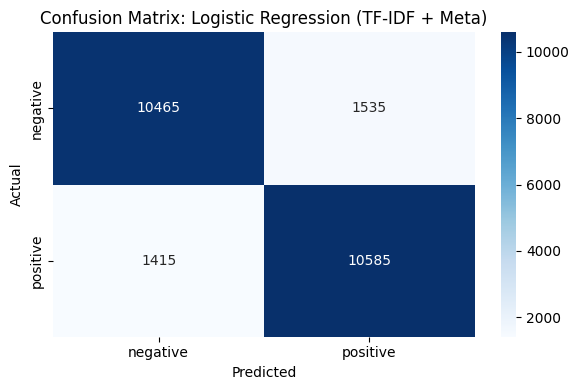

In [ ]:
lr_param_dist_combined = {'C': [0.1, 1, 10]}

lr_model_combined = run_randomized_model_precombined(
    name="Logistic Regression (TF-IDF + Meta)",
    model=LogisticRegression(
        class_weight='balanced',
        solver='saga',
        max_iter=500,
        n_jobs=-1,
        random_state=42
    ),
    param_dist=lr_param_dist_combined,
    X_train=X_combined_train,
    y_train=y_train,
    X_val=X_combined_val,
    y_val=y_val,
    n_iter=3
)


## SVM

### 1. Meta Features + SVM


- Linear SVM - Meta Only -


/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Training Accuracy: 0.5969027777777778
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.52      0.56     36000
    positive       0.58      0.68      0.63     36000

    accuracy                           0.60     72000
   macro avg       0.60      0.60      0.59     72000
weighted avg       0.60      0.60      0.59     72000


Validation Accuracy: 0.5977916666666667
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.52      0.56     12000
    positive       0.58      0.68      0.63     12000

    accuracy                           0.60     24000
   macro avg       0.60      0.60      0.60     24000
weighted avg       0.60      0.60      0.60     24000

Best Parameters: {'C': 1}
Best Cross-Validation Accuracy: 0.5966527777777778
Training Time: 0.50 seconds

Confusion Matrix (Validation Set):
          negative  positive
negative      6194      5806
po

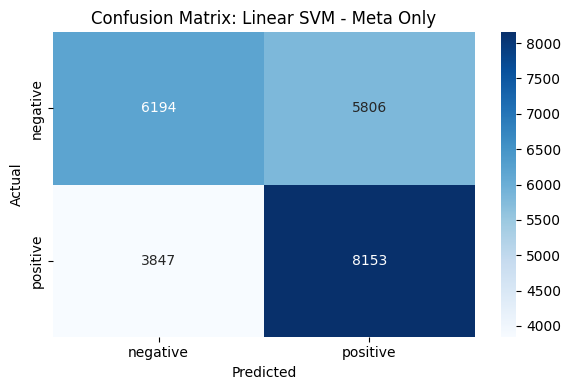

In [ ]:
from sklearn.svm import LinearSVC

svm_param_dist_meta = {'C': [0.01, 0.1, 1]}

svm_model_meta = run_randomized_model_precombined(
    name="Linear SVM - Meta Only",
    model=LinearSVC(
        class_weight='balanced',
        dual=False,
        max_iter=2000,
        random_state=42
    ),
    param_dist=svm_param_dist_meta,
    X_train=X_meta_train,
    y_train=y_train,
    X_val=X_meta_val,
    y_val=y_val
)


### 2. TF IDF + SVM


- Linear SVM (TF-IDF Only) -
Training Accuracy: 0.8967361111111111
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.90     36000
    positive       0.89      0.90      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.876625
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000

Best Parameters: {'C': 0.1}
Best Cross-Validation Accuracy: 0.8795138888888889
Training Time: 1.54 seconds

Confusion Matrix (Validation Set):
          negative  positive
negative 

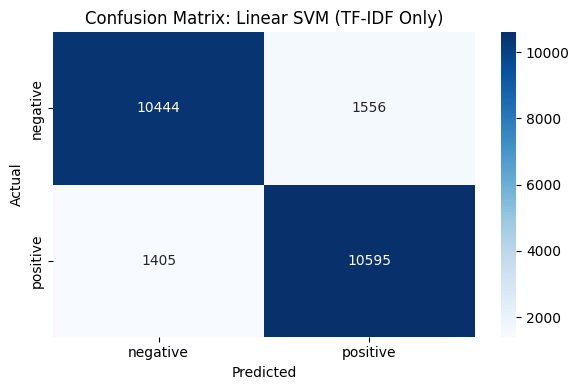

In [ ]:
from sklearn.svm import LinearSVC

# Hyperparameter grid (without the clf__ prefix)
svm_param_dist_text = {'C': [0.01, 0.1, 1]}

# SVM model for TF-IDF only (using precombined since there's no pipeline)
svm_model_text = run_randomized_model_precombined(
    name="Linear SVM (TF-IDF Only)",
    model=LinearSVC(
        class_weight='balanced',
        dual=False,
        max_iter=2000,
        random_state=42
    ),
    param_dist=svm_param_dist_text,
    X_train=X_text_train,
    y_train=y_train,
    X_val=X_text_val,
    y_val=y_val,
    n_iter=3
)


### 3. (TF-IDF + Meta Features) + SVM


- Linear SVM - TF-IDF + Meta Combined -


/opt/anaconda3/lib/python3.12/site-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=10. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Training Accuracy: 0.8980277777777778
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.90     36000
    positive       0.89      0.91      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.8774583333333333
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000

Best Parameters: {'C': 0.1}
Best Cross-Validation Accuracy: 0.8803055555555556
Training Time: 2.14 seconds

Confusion Matrix (Validation Set):
          negative  positive
negative     10453      1547


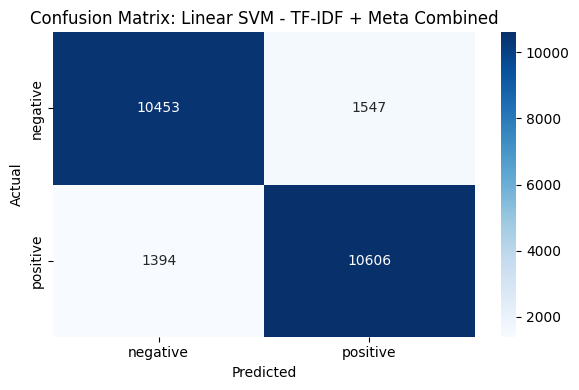

In [ ]:
svm_param_dist_combined = {'C': [0.01, 0.1, 1]}

svm_model_combined = run_randomized_model_precombined(
    name="Linear SVM - TF-IDF + Meta Combined",
    model=LinearSVC(
        class_weight='balanced',
        dual=False,
        max_iter=2000,
        random_state=42
    ),
    param_dist=svm_param_dist_combined,
    X_train=X_combined_train,
    y_train=y_train,
    X_val=X_combined_val,
    y_val=y_val
)


## Random Forest

### 1. Meta Features + Random Forest


- Random Forest - Meta Only -
Training Accuracy: 0.6902777777777778
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.71      0.65      0.68     36000
    positive       0.68      0.73      0.70     36000

    accuracy                           0.69     72000
   macro avg       0.69      0.69      0.69     72000
weighted avg       0.69      0.69      0.69     72000


Validation Accuracy: 0.6175
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.63      0.58      0.60     12000
    positive       0.61      0.65      0.63     12000

    accuracy                           0.62     24000
   macro avg       0.62      0.62      0.62     24000
weighted avg       0.62      0.62      0.62     24000

Best Parameters: {'n_estimators': 200, 'max_depth': 20}
Best Cross-Validation Accuracy: 0.6094722222222222
Training Time: 22.30 seconds

Confusion Matrix (Validation Set):
          

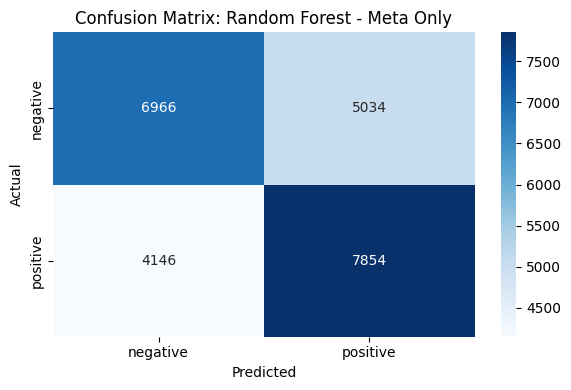

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_param_dist_meta = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20]
}

rf_model_meta = run_randomized_model_precombined(
    name="Random Forest - Meta Only",
    model=RandomForestClassifier(
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=rf_param_dist_meta,
    X_train=X_meta_train,
    y_train=y_train,
    X_val=X_meta_val,
    y_val=y_val,
    n_iter=3
)

### 2. TF-IDF + Random Forest


- Random Forest - TF-IDF Only -
Training Accuracy: 0.8930694444444445
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.89     36000
    positive       0.89      0.90      0.89     36000

    accuracy                           0.89     72000
   macro avg       0.89      0.89      0.89     72000
weighted avg       0.89      0.89      0.89     72000


Validation Accuracy: 0.8475
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.85      0.85      0.85     12000
    positive       0.85      0.85      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000

Best Parameters: {'n_estimators': 200, 'max_depth': None}
Best Cross-Validation Accuracy: 0.8487777777777777
Training Time: 19.73 seconds

Confusion Matrix (Validation Set):
      

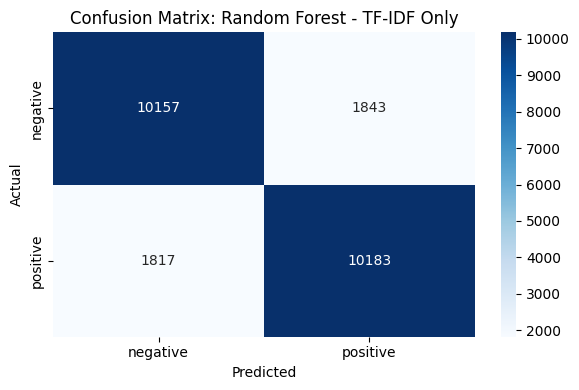

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_param_dist_text = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20]
}

rf_model_text = run_randomized_model_precombined(
    name="Random Forest - TF-IDF Only",
    model=RandomForestClassifier(
        n_estimators=300,
        max_depth=7,
        min_samples_leaf=10,
        min_samples_split=20,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=rf_param_dist_text,
    X_train=X_text_train,
    y_train=y_train,
    X_val=X_text_val,
    y_val=y_val,
    n_iter=3
)


### 3. (TF-IDF + Meta Features) + Random Forest


- Random Forest - TF-IDF + Meta Combined -
Training Accuracy: 0.8969583333333333
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.90      0.89      0.90     36000
    positive       0.89      0.90      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.8492083333333333
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.85      0.85      0.85     12000
    positive       0.85      0.85      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000

Best Parameters: {'n_estimators': 200, 'max_depth': None}
Best Cross-Validation Accuracy: 0.8517638888888889
Training Time: 21.45 seconds

Confusion Matrix (

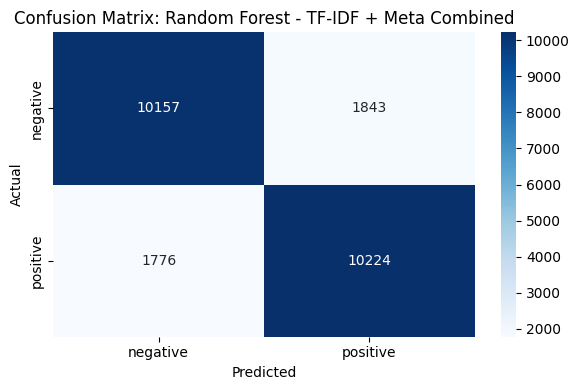

In [ ]:
rf_param_dist_combined = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20]
}

rf_model_combined = run_randomized_model_precombined(
    name="Random Forest - TF-IDF + Meta Combined",
    model=RandomForestClassifier(
        n_estimators=300,
        max_depth=7,
        min_samples_leaf=10,
        min_samples_split=20,
        max_features='sqrt',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=rf_param_dist_combined,
    X_train=X_combined_train,
    y_train=y_train,
    X_val=X_combined_val,
    y_val=y_val,
    n_iter=3
)


## LightGBM

### 1. Meta Features + LightGBM


- LightGBM - Meta Only -
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000[LightGBM] [Info] Number of positive: 24000, number of negative: 24000

[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031966 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 329
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of te

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/

[LightGBM] [Info] Number of positive: 36000, number of negative: 36000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002003 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 72000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training Accuracy: 0.6318194444444445
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.64      0.59      0.62     36000
    positive       0.62      0.67      0.65     36000

    accuracy                           0.63     72000
   macro avg       0.63      0.63      0.63     72000
weighted avg       0.63      0.63      0.63     72000


Validation Accuracy: 0.62075
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.63      0.58      0.61     12000
    positive       0.61      0.66      0.64     12000

    accuracy                           0.62     24000
   macro avg       0.62      0.62      0.62     24000
weighted avg       0.62      0.62      0.62     24000

Best Parameters: {'num_leaves': 31, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1}
Best Cross-Validation Accuracy: 0.6142500000000001
Training Time: 9.53 seconds

Confusion Matrix (Validation Set):
 

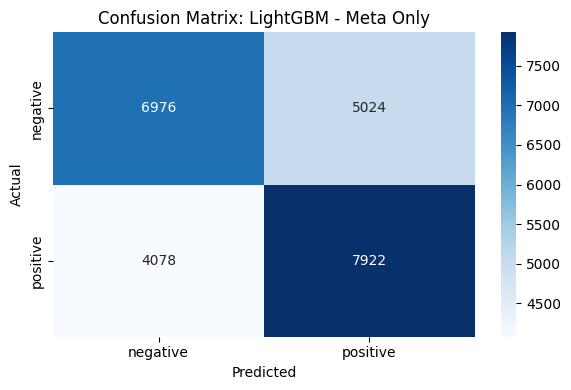

In [ ]:
from lightgbm import LGBMClassifier

lgbm_param_dist_meta = {
    'num_leaves': [31, 50, 70],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 10, 20]
}

lgbm_model_meta = run_randomized_model_precombined(
    name="LightGBM - Meta Only",
    model=LGBMClassifier(
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=lgbm_param_dist_meta,
    X_train=X_meta_train,
    y_train=y_train,
    X_val=X_meta_val,
    y_val=y_val,
    n_iter=3
)


### 2. TF-IDF + LightGBM


- LightGBM - TF-IDF Only -
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.172918 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 357164
[LightGBM] [Info] Number of data points in the train set: 48000, number

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/

[LightGBM] [Info] Number of positive: 36000, number of negative: 36000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.312499 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 452082
[LightGBM] [Info] Number of data points in the train set: 72000, number of used features: 5000
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training Accuracy: 0.9025277777777778
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.91      0.89      0.90     36000
    positive       0.89      0.91      0.90     36000

    accuracy                           0.90     72000
   macro avg       0.90      0.90      0.90     72000
weighted avg       0.90      0.90      0.90     72000


Validation Accuracy: 0.8687916666666666
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.86      0.87     12000
    positive       0.86      0.88      0.87     12000

    accuracy                           0.87     24000
   macro avg       0.87      0.87      0.87     24000
weighted avg       0.87      0.87      0.87     24000

Best Parameters: {'num_leaves': 31, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1}
Best Cross-Validation Accuracy: 0.8704166666666667
Training Time: 50.68 seconds

Confusion Matrix (Valida

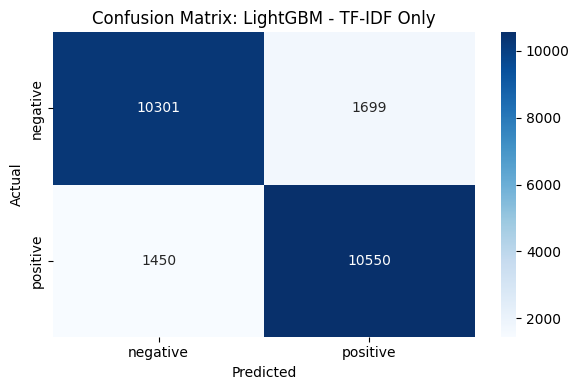

In [ ]:
lgbm_param_dist_text = {
    'num_leaves': [31, 50, 70],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 10, 20]
}

lgbm_model_text = run_randomized_model_precombined(
    name="LightGBM - TF-IDF Only",
    model=LGBMClassifier(
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=lgbm_param_dist_text,
    X_train=X_text_train,
    y_train=y_train,
    X_val=X_text_val,
    y_val=y_val,
    n_iter=3
)


### 3. (TF-IDF + Meta Features) + LightGBM


- LightGBM - TF-IDF + Meta Combined -
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.413252 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Number of positive: 24000, number of negative: 24000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 2.467692 s

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/

[LightGBM] [Info] Number of positive: 36000, number of negative: 36000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.208517 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 452419
[LightGBM] [Info] Number of data points in the train set: 72000, number of used features: 5010
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Training Accuracy: 0.9060416666666666
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.91      0.90      0.91     36000
    positive       0.90      0.92      0.91     36000

    accuracy                           0.91     72000
   macro avg       0.91      0.91      0.91     72000
weighted avg       0.91      0.91      0.91     72000


Validation Accuracy: 0.8731666666666666
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.86      0.87     12000
    positive       0.87      0.88      0.87     12000

    accuracy                           0.87     24000
   macro avg       0.87      0.87      0.87     24000
weighted avg       0.87      0.87      0.87     24000

Best Parameters: {'num_leaves': 31, 'n_estimators': 200, 'max_depth': -1, 'learning_rate': 0.1}
Best Cross-Validation Accuracy: 0.8737361111111112
Training Time: 50.30 seconds

Confusion Matrix (Valida

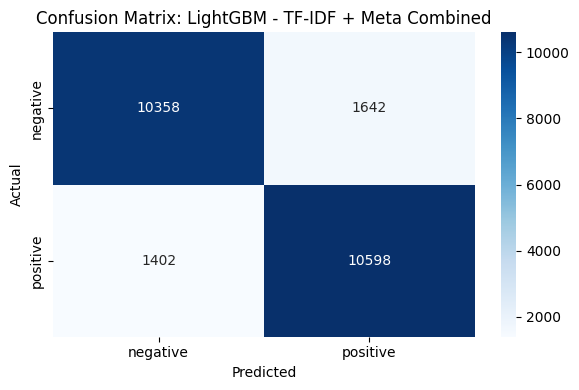

In [ ]:
lgbm_param_dist_combined = {
    'num_leaves': [31, 50, 70],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 10, 20]
}

lgbm_model_combined = run_randomized_model_precombined(
    name="LightGBM - TF-IDF + Meta Combined",
    model=LGBMClassifier(
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ),
    param_dist=lgbm_param_dist_combined,
    X_train=X_combined_train,
    y_train=y_train,
    X_val=X_combined_val,
    y_val=y_val,
    n_iter=3
)


## Save Machine Learning Model Function

In [ ]:
def save_model(name, model, path="saved_models/"):
    if not os.path.exists(path):
        os.makedirs(path)

    filename = os.path.join(path, f"{name.replace(' ', '_').lower()}.pkl")
    joblib.dump(model, filename)
    print(f"Model '{name}' saved to '{filename}'")


In [ ]:
# Naive Bayes
save_model("nb_model_meta", nb_model_meta.best_estimator_)
save_model("nb_model_text", nb_model.best_estimator_)
save_model("nb_model_combined", nb_model_combined.best_estimator_)

# Logistic Regression
save_model("logreg_model_meta", lr_model_meta.best_estimator_)
save_model("logreg_model_text", lr_model_text.best_estimator_)
save_model("logreg_model_combined", lr_model_combined.best_estimator_)

# SVM
save_model("svm_model_meta", svm_model_meta.best_estimator_)
save_model("svm_model_text", svm_model_text.best_estimator_)
save_model("svm_model_combined", svm_model_combined.best_estimator_)

# Random Forest
save_model("rf_model_meta", rf_model_meta.best_estimator_)
save_model("rf_model_text", rf_model_text.best_estimator_)
save_model("rf_model_combined", rf_model_combined.best_estimator_)

# LightGBM
save_model("lgbm_model_meta", lgbm_model_meta.best_estimator_)
save_model("lgbm_model_text", lgbm_model_text.best_estimator_)
save_model("lgbm_model_combined", lgbm_model_combined.best_estimator_)

# Vectorizer & Encoder
save_model("tfidf_vectorizer", tfidf)
save_model("meta_scaler", scaler)

Model 'nb_model_meta' saved to 'saved_models/nb_model_meta.pkl'
Model 'nb_model_text' saved to 'saved_models/nb_model_text.pkl'
Model 'nb_model_combined' saved to 'saved_models/nb_model_combined.pkl'
Model 'logreg_model_meta' saved to 'saved_models/logreg_model_meta.pkl'
Model 'logreg_model_text' saved to 'saved_models/logreg_model_text.pkl'
Model 'logreg_model_combined' saved to 'saved_models/logreg_model_combined.pkl'
Model 'svm_model_meta' saved to 'saved_models/svm_model_meta.pkl'
Model 'svm_model_text' saved to 'saved_models/svm_model_text.pkl'
Model 'svm_model_combined' saved to 'saved_models/svm_model_combined.pkl'
Model 'rf_model_meta' saved to 'saved_models/rf_model_meta.pkl'
Model 'rf_model_text' saved to 'saved_models/rf_model_text.pkl'
Model 'rf_model_combined' saved to 'saved_models/rf_model_combined.pkl'
Model 'lgbm_model_meta' saved to 'saved_models/lgbm_model_meta.pkl'
Model 'lgbm_model_text' saved to 'saved_models/lgbm_model_text.pkl'
Model 'lgbm_model_combined' saved 

## Test Function

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from scipy.sparse import issparse

def test_model(name, model_path, X_test, y_test, label_encoder=None, dense=False):
    print(f"\nTest model: {name}")

    # Load model
    model = joblib.load(model_path)

    # Convert to dense if needed
    if dense and issparse(X_test):
        X_test = X_test.toarray()

    # Predict
    y_pred = model.predict(X_test)

    # Decode if needed
    if label_encoder:
        y_test = label_encoder.inverse_transform(y_test)
        y_pred = label_encoder.inverse_transform(y_pred)

    # Accuracy & Report
    acc = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {acc:.4f}")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))

    # Confusion Matrix
    labels = label_encoder.classes_ if label_encoder else sorted(set(y_test))
    cm = confusion_matrix(y_test, y_pred)
    df_cm = pd.DataFrame(cm, index=labels, columns=labels)

    plt.figure(figsize=(6, 4))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()


In [ ]:
model_groups = {
    "Naive Bayes": [
        ("Meta",     "nb_model_meta.pkl",     X_meta_test.toarray(), True),
        ("TF-IDF",   "nb_model_text.pkl",     X_text_test,           False),
        ("Combined", "nb_model_combined.pkl", X_combined_test,       False),
    ],
    "Logistic Regression": [
        ("Meta",     "logreg_model_meta.pkl",     X_meta_test.toarray(), True),
        ("TF-IDF",   "logreg_model_text.pkl",     X_text_test,           False),
        ("Combined", "logreg_model_combined.pkl", X_combined_test,       False),
    ],
    "SVM": [
        ("Meta",     "svm_model_meta.pkl",     X_meta_test.toarray(), True),
        ("TF-IDF",   "svm_model_text.pkl",     X_text_test,           False),
        ("Combined", "svm_model_combined.pkl", X_combined_test,       False),
    ],
    "Random Forest": [
        ("Meta",     "rf_model_meta.pkl",     X_meta_test.toarray(), True),
        ("TF-IDF",   "rf_model_text.pkl",     X_text_test,           False),
        ("Combined", "rf_model_combined.pkl", X_combined_test,       False),
    ],
    "LightGBM": [
        ("Meta",     "lgbm_model_meta.pkl",     X_meta_test.toarray(), True),
        ("TF-IDF",   "lgbm_model_text.pkl",     X_text_test,           False),
        ("Combined", "lgbm_model_combined.pkl", X_combined_test,       False),
    ],
}


## Naive Bayes Test


Test model: Naive Bayes (Meta)
Accuracy: 0.5667
Classification Report:
              precision    recall  f1-score   support

    negative       0.58      0.48      0.53     12000
    positive       0.56      0.65      0.60     12000

    accuracy                           0.57     24000
   macro avg       0.57      0.57      0.56     24000
weighted avg       0.57      0.57      0.56     24000



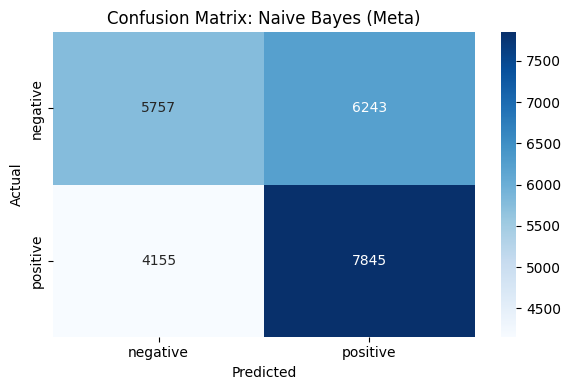


Test model: Naive Bayes (TF-IDF)
Accuracy: 0.8488
Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.82      0.84     12000
    positive       0.83      0.88      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000



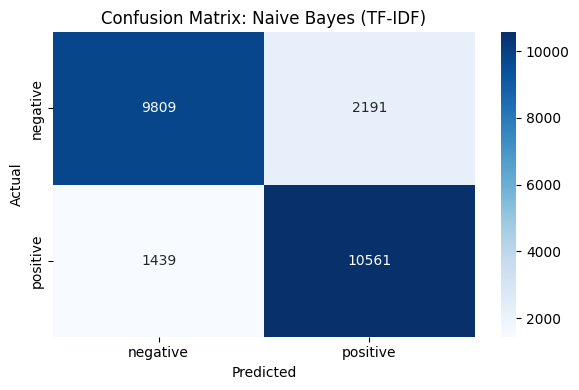


Test model: Naive Bayes (Combined)
Accuracy: 0.8442
Classification Report:
              precision    recall  f1-score   support

    negative       0.86      0.82      0.84     12000
    positive       0.83      0.87      0.85     12000

    accuracy                           0.84     24000
   macro avg       0.85      0.84      0.84     24000
weighted avg       0.85      0.84      0.84     24000



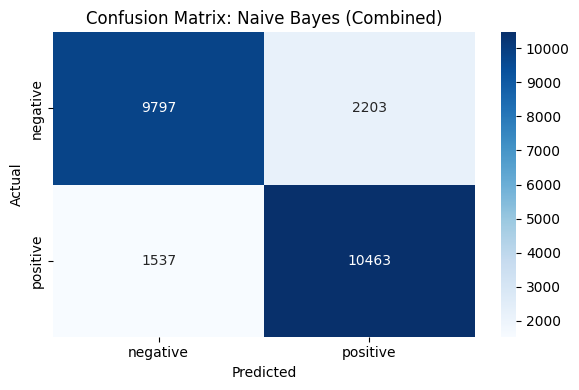

In [ ]:
selected_model_type = "Naive Bayes"

for variant_name, filename, X_input, is_dense in model_groups[selected_model_type]:
    test_model(
        name=f"{selected_model_type} ({variant_name})",
        model_path=f"saved_models/{filename}",
        X_test=X_input,
        y_test=y_test,
        dense=is_dense
    )


## Logistic Regression Test


Test model: Logistic Regression (Meta)
Accuracy: 0.5966
Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.52      0.56     12000
    positive       0.58      0.68      0.63     12000

    accuracy                           0.60     24000
   macro avg       0.60      0.60      0.59     24000
weighted avg       0.60      0.60      0.59     24000



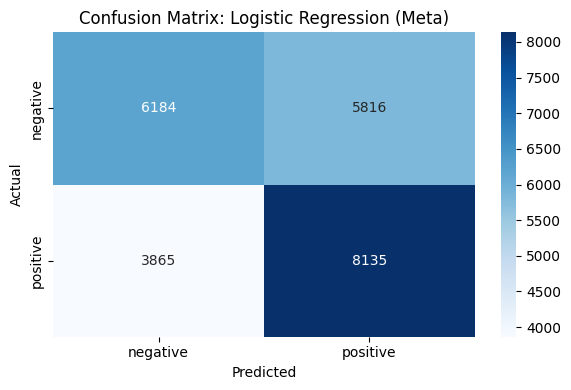


Test model: Logistic Regression (TF-IDF)
Accuracy: 0.8780
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



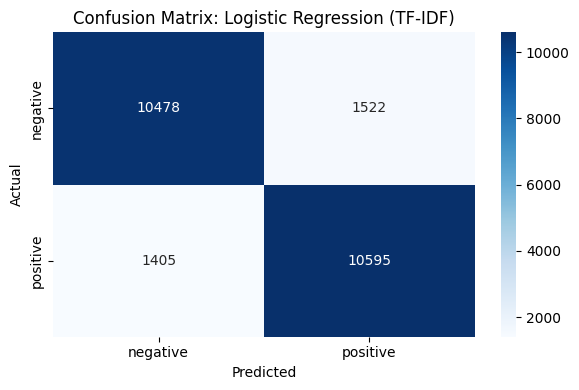


Test model: Logistic Regression (Combined)
Accuracy: 0.8782
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



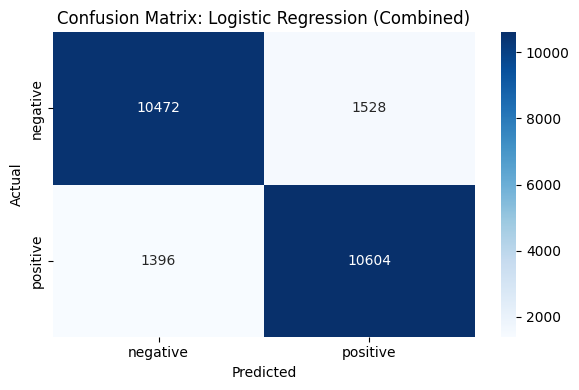

In [ ]:
selected_model_type = "Logistic Regression"

for variant_name, filename, X_input, is_dense in model_groups[selected_model_type]:
    test_model(
        name=f"{selected_model_type} ({variant_name})",
        model_path=f"saved_models/{filename}",
        X_test=X_input,
        y_test=y_test,
        dense=is_dense
    )


## SVM Test


Test model: SVM (Meta)
Accuracy: 0.5964
Classification Report:
              precision    recall  f1-score   support

    negative       0.62      0.51      0.56     12000
    positive       0.58      0.68      0.63     12000

    accuracy                           0.60     24000
   macro avg       0.60      0.60      0.59     24000
weighted avg       0.60      0.60      0.59     24000



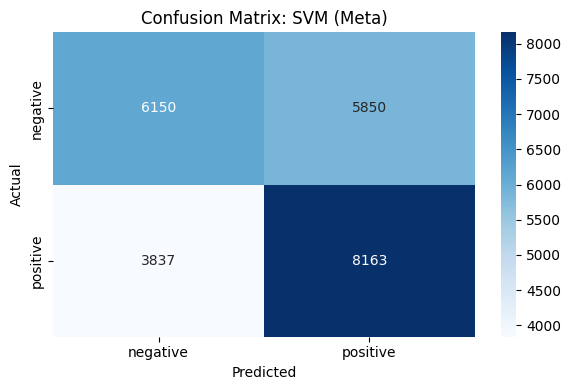


Test model: SVM (TF-IDF)
Accuracy: 0.8783
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.88      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



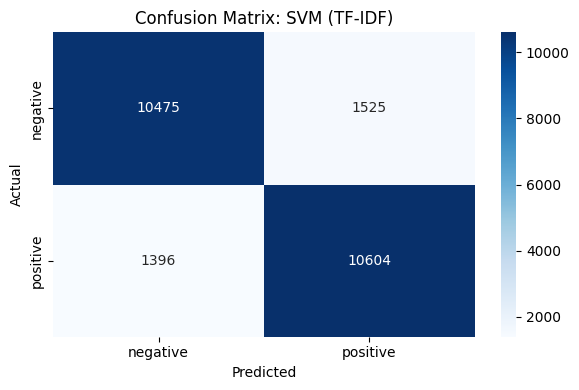


Test model: SVM (Combined)
Accuracy: 0.8788
Classification Report:
              precision    recall  f1-score   support

    negative       0.88      0.87      0.88     12000
    positive       0.87      0.89      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



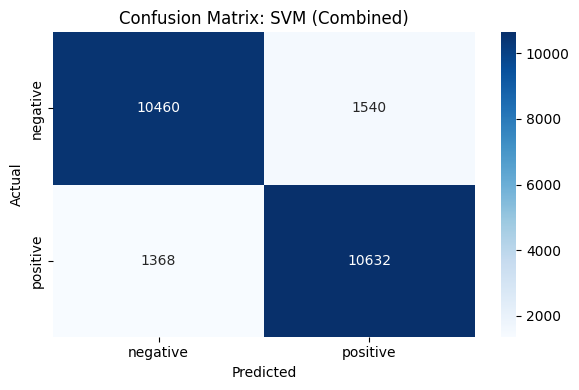

In [ ]:
selected_model_type = "SVM"

for variant_name, filename, X_input, is_dense in model_groups[selected_model_type]:
    test_model(
        name=f"{selected_model_type} ({variant_name})",
        model_path=f"saved_models/{filename}",
        X_test=X_input,
        y_test=y_test,
        dense=is_dense
    )

## Random Forest Test


Test model: Random Forest (Meta)
Accuracy: 0.6180
Classification Report:
              precision    recall  f1-score   support

    negative       0.63      0.58      0.60     12000
    positive       0.61      0.65      0.63     12000

    accuracy                           0.62     24000
   macro avg       0.62      0.62      0.62     24000
weighted avg       0.62      0.62      0.62     24000



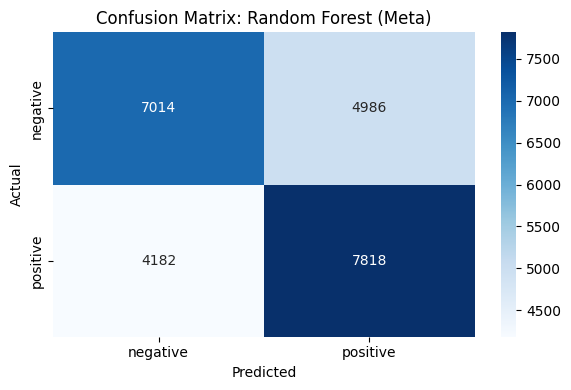


Test model: Random Forest (TF-IDF)
Accuracy: 0.8464
Classification Report:
              precision    recall  f1-score   support

    negative       0.84      0.85      0.85     12000
    positive       0.85      0.84      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000



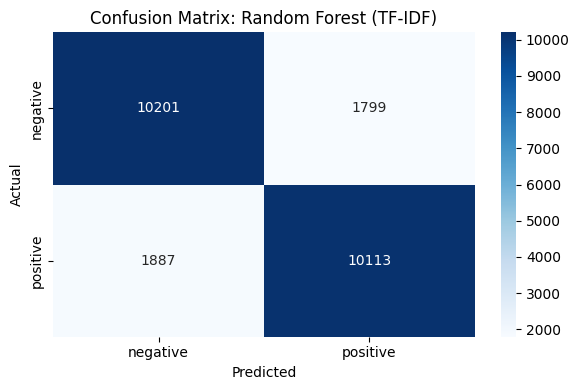


Test model: Random Forest (Combined)
Accuracy: 0.8505
Classification Report:
              precision    recall  f1-score   support

    negative       0.85      0.85      0.85     12000
    positive       0.85      0.85      0.85     12000

    accuracy                           0.85     24000
   macro avg       0.85      0.85      0.85     24000
weighted avg       0.85      0.85      0.85     24000



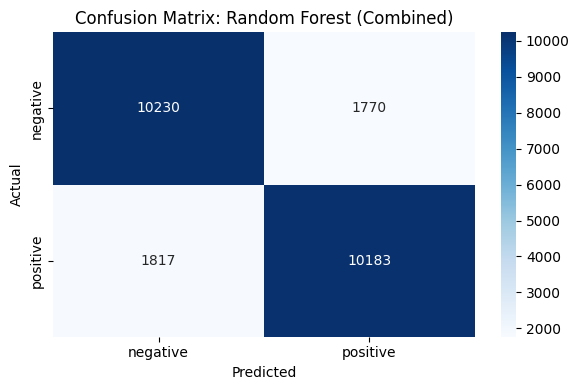

In [ ]:
selected_model_type = "Random Forest"

for variant_name, filename, X_input, is_dense in model_groups[selected_model_type]:
    test_model(
        name=f"{selected_model_type} ({variant_name})",
        model_path=f"saved_models/{filename}",
        X_test=X_input,
        y_test=y_test,
        dense=is_dense
    )

## LightGBM Test


Test model: LightGBM (Meta)
Accuracy: 0.6183
Classification Report:
              precision    recall  f1-score   support

    negative       0.63      0.58      0.60     12000
    positive       0.61      0.66      0.63     12000

    accuracy                           0.62     24000
   macro avg       0.62      0.62      0.62     24000
weighted avg       0.62      0.62      0.62     24000



/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


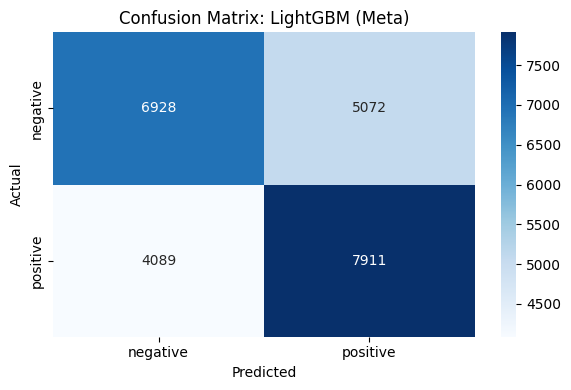


Test model: LightGBM (TF-IDF)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Accuracy: 0.8661
Classification Report:
              precision    recall  f1-score   support

    negative       0.87      0.86      0.87     12000
    positive       0.86      0.87      0.87     12000

    accuracy                           0.87     24000
   macro avg       0.87      0.87      0.87     24000
weighted avg       0.87      0.87      0.87     24000



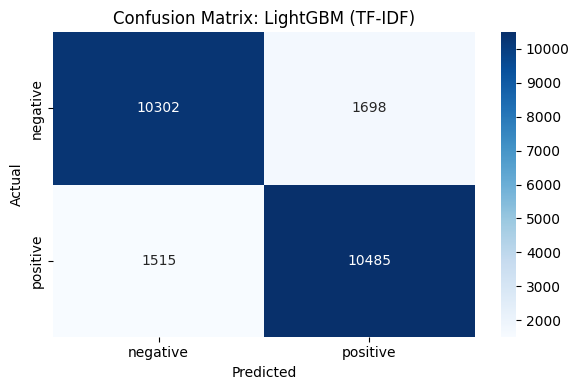


Test model: LightGBM (Combined)
Accuracy: 0.8723
Classification Report:


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


              precision    recall  f1-score   support

    negative       0.88      0.86      0.87     12000
    positive       0.86      0.88      0.87     12000

    accuracy                           0.87     24000
   macro avg       0.87      0.87      0.87     24000
weighted avg       0.87      0.87      0.87     24000



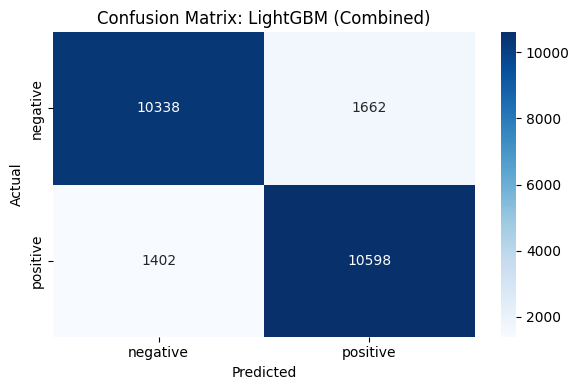

In [ ]:
selected_model_type = "LightGBM"

for variant_name, filename, X_input, is_dense in model_groups[selected_model_type]:
    test_model(
        name=f"{selected_model_type} ({variant_name})",
        model_path=f"saved_models/{filename}",
        X_test=X_input,
        y_test=y_test,
        dense=is_dense
    )

## Deep Lerning Model

## FNN

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import time

# Convert Sparse Feature Matrices to Dense Format

# TF-IDF Only
X_text_train_dense = X_text_train.toarray()
X_text_val_dense   = X_text_val.toarray()

# Meta Features Only
X_meta_train_dense = X_meta_train.toarray()
X_meta_val_dense   = X_meta_val.toarray()

# TF-IDF + Meta Combined
X_combined_train_dense = X_combined_train.toarray()
X_combined_val_dense   = X_combined_val.toarray()

# Encode class labels into one-hot format

label_encoder = LabelEncoder()

# Convert string labels (e.g., "positive", "negative") into integers
y_train_int = label_encoder.fit_transform(y_train)
y_val_int   = label_encoder.transform(y_val)
y_test_int  = label_encoder.transform(y_test)

# Convert integer labels into one-hot encoded vectors
y_train_enc = to_categorical(y_train_int)
y_val_enc   = to_categorical(y_val_int)
y_test_enc  = to_categorical(y_test_int)

# Build FNN Model
def build_fnn_model(input_dim, output_dim):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(output_dim, activation='softmax')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Train and Evaluate the Model
def train_and_validate_fnn(model, X_train, y_train_enc, X_val, y_val_enc, encoder, name="", epochs=20, batch_size=64):
    early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

    print(f"\nTraining FNN model for: {name}")

    start_time = time.time()
    history = model.fit(
        X_train, y_train_enc,
        validation_data=(X_val, y_val_enc),
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[early_stop],
        verbose=1
    )
    duration = time.time() - start_time
    print(f" Trining completed in {duration:.2f} seconds")

    # Prediction
    y_val_probs = model.predict(X_val)
    y_val_pred = np.argmax(y_val_probs, axis=1)
    y_val_true = np.argmax(y_val_enc, axis=1)

    # Report
    print(f"\nClassification Report ({name}):")
    print(classification_report(y_val_true, y_val_pred, target_names=encoder.classes_))

    # Confusion Matrix
    cm = confusion_matrix(y_val_true, y_val_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.classes_)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix ({name})")
    plt.show()

    # Accuracy & Loss Plots
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Accuracy Curve ({name})')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Loss Curve ({name})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return model, history


### 1. Meta Features

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training FNN model for: Meta Features Only
Epoch 1/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 649us/step - accuracy: 0.5517 - loss: 0.6837 - val_accuracy: 0.5822 - val_loss: 0.6722
Epoch 2/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 518us/step - accuracy: 0.5758 - loss: 0.6736 - val_accuracy: 0.5945 - val_loss: 0.6632
Epoch 3/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 547us/step - accuracy: 0.5872 - loss: 0.6665 - val_accuracy: 0.6027 - val_loss: 0.6555
Epoch 4/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 557us/step - accuracy: 0.5940 - loss: 0.6613 - val_accuracy: 0.6067 - val_loss: 0.6532
Epoch 5/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 571us/step - accuracy: 0.5975 - loss: 0.6593 - val_accuracy: 0.6006 - val_loss: 0.6545
Epoch 6/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 588us/step - accuracy: 0.5965 - loss: 0.6584 - val_accuracy: 0.5998 - val_loss: 0.6538
Epoch 7/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 543us/step - accuracy: 0.5947 - loss: 0.6559 - val_accuracy: 0.5999 - val_loss: 0.6525
Epoch 8/20
1125/1125 ━━━━━━━━━━━

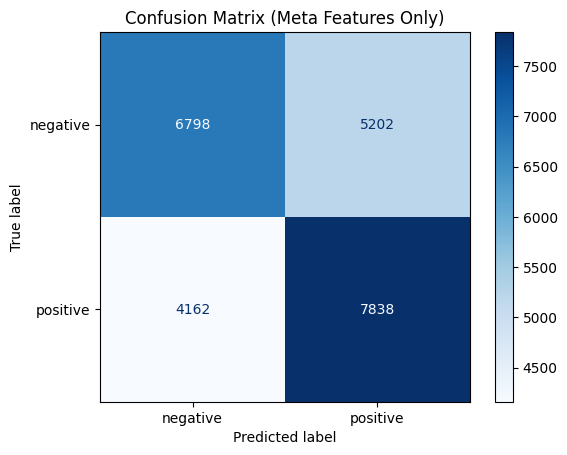

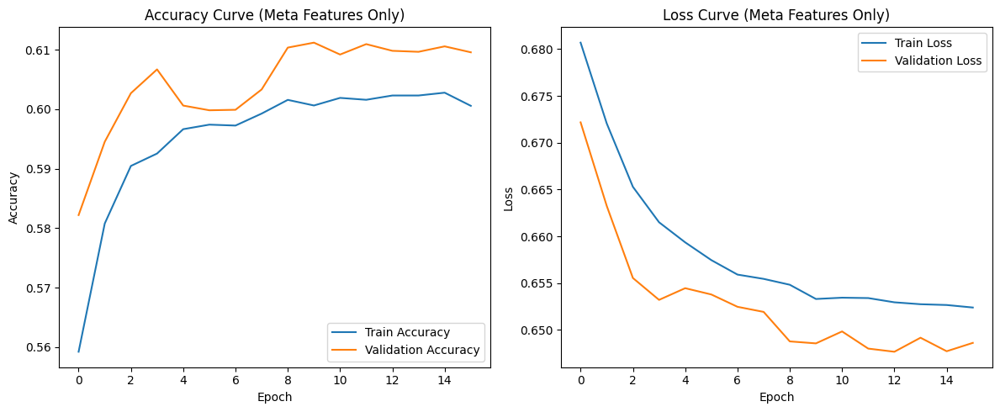

(<Sequential name=sequential, built=True>,
 <keras.src.callbacks.history.History at 0x354bc7050>)

In [ ]:
# Meta Only
model_meta = build_fnn_model(X_meta_train_dense.shape[1], y_train_enc.shape[1])
train_and_validate_fnn(model_meta, X_meta_train_dense, y_train_enc, X_meta_val_dense, y_val_enc, encoder=label_encoder, name="Meta Features Only")

### 2. TF-IDF

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training FNN model for: TF-IDF Only
Epoch 1/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8328 - loss: 0.3831 - val_accuracy: 0.8750 - val_loss: 0.2848
Epoch 2/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8988 - loss: 0.2479 - val_accuracy: 0.8758 - val_loss: 0.2907
Epoch 3/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9196 - loss: 0.2019 - val_accuracy: 0.8728 - val_loss: 0.3077
Epoch 4/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9498 - loss: 0.1425 - val_accuracy: 0.8690 - val_loss: 0.3657
 Trining completed in 11.55 seconds
750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step

Classification Report (TF-IDF Only):
              precision    recall  f1-score   support

    negative       0.87      0.88      0.88     12000
    positive       0.88      0.87      0.87     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000


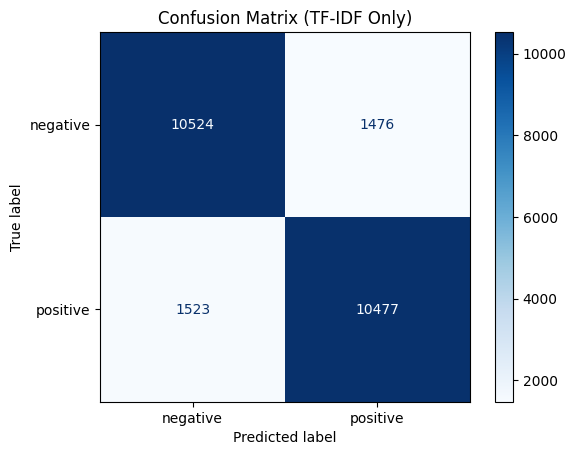

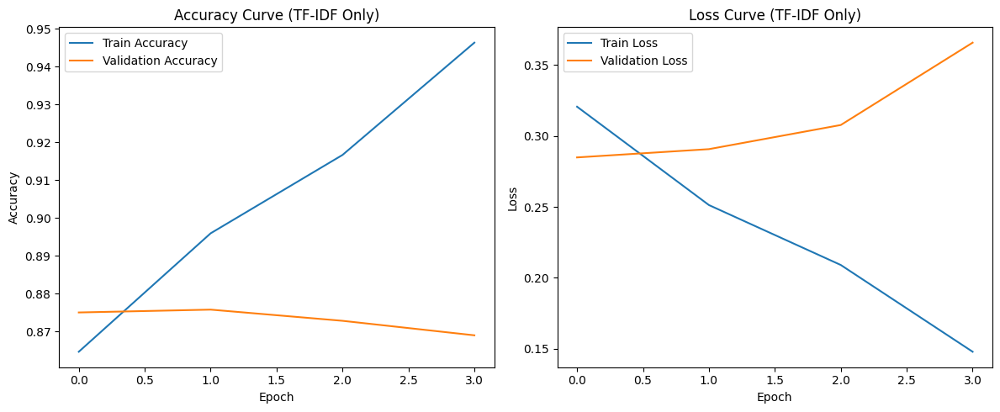

(<Sequential name=sequential_1, built=True>,
 <keras.src.callbacks.history.History at 0x3ab821280>)

In [ ]:
# TF-IDF Only
model_text = build_fnn_model(X_text_train_dense.shape[1], y_train_enc.shape[1])
train_and_validate_fnn(model_text, X_text_train_dense, y_train_enc, X_text_val_dense, y_val_enc,  encoder=label_encoder, name="TF-IDF Only")

### 3. TF-IDF + Meta Features

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Training FNN model for: TF-IDF + Meta Combined
Epoch 1/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8249 - loss: 0.3861 - val_accuracy: 0.8780 - val_loss: 0.2813
Epoch 2/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9007 - loss: 0.2444 - val_accuracy: 0.8773 - val_loss: 0.2861
Epoch 3/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9234 - loss: 0.1992 - val_accuracy: 0.8755 - val_loss: 0.3014
Epoch 4/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9477 - loss: 0.1447 - val_accuracy: 0.8725 - val_loss: 0.3526
 Trining completed in 11.63 seconds
750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step

Classification Report (TF-IDF + Meta Combined):
              precision    recall  f1-score   support

    negative       0.89      0.87      0.88     12000
    positive       0.87      0.89      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.8

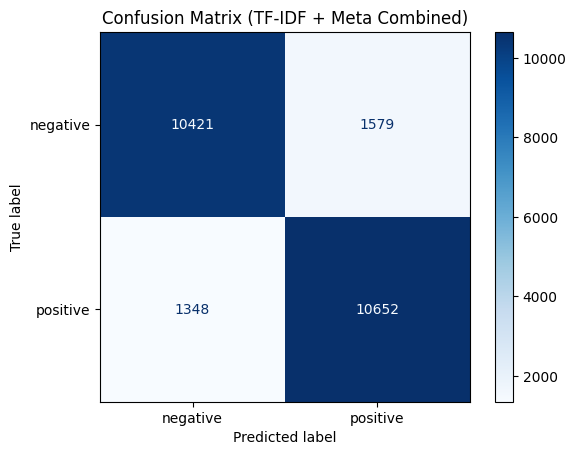

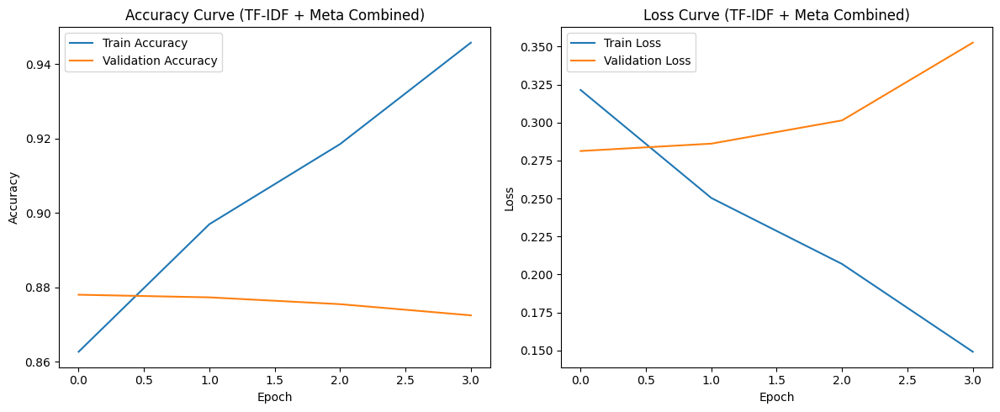

(<Sequential name=sequential_2, built=True>,
 <keras.src.callbacks.history.History at 0x3fab64d40>)

In [ ]:
# Combined
model_combined = build_fnn_model(X_combined_train_dense.shape[1], y_train_enc.shape[1])
train_and_validate_fnn(model_combined, X_combined_train_dense, y_train_enc, X_combined_val_dense, y_val_enc,  encoder=label_encoder, name="TF-IDF + Meta Combined")

## Save Model

In [ ]:
from tensorflow.keras.models import load_model

# Save a trained FNN model to .h5 file
def save_fnn_model(model, name):
    path = f"saved_fnn_models/FNN_{name}.h5"
    os.makedirs("saved_fnn_models", exist_ok=True)
    model.save(path)
    print(f" Model saved to: {path}")

# Save FNN models for each feature set
save_fnn_model(model_meta, name="Meta")
save_fnn_model(model_text, name="Text")
save_fnn_model(model_combined, name="Combined")



 Model saved to: saved_fnn_models/FNN_Meta.h5
 Model saved to: saved_fnn_models/FNN_Text.h5
 Model saved to: saved_fnn_models/FNN_Combined.h5


## Test Function

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import load_model

# Load a saved FNN model and evaluate it on test data
def test_fnn_model(name, model_path, X_test, y_test_enc, encoder):
    print(f"\nTesting FNN model: {name}")

    # Load model from .h5 file
    model = load_model(model_path)

    # Predict class probabilities
    y_probs = model.predict(X_test)

    # Convert predictions and true labels from one-hot to class indices
    y_pred = np.argmax(y_probs, axis=1)
    y_true = np.argmax(y_test_enc, axis=1)

    # Print classification report
    print(f"\nClassification Report ({name}):")
    print(classification_report(y_true, y_pred, target_names=encoder.classes_))

    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=encoder.classes_)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f"Confusion Matrix ({name})")
    plt.show()



Testing FNN model: FNN_meta
750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 176us/step

Classification Report (FNN_meta):
              precision    recall  f1-score   support

    negative       0.62      0.57      0.59     12000
    positive       0.60      0.65      0.63     12000

    accuracy                           0.61     24000
   macro avg       0.61      0.61      0.61     24000
weighted avg       0.61      0.61      0.61     24000



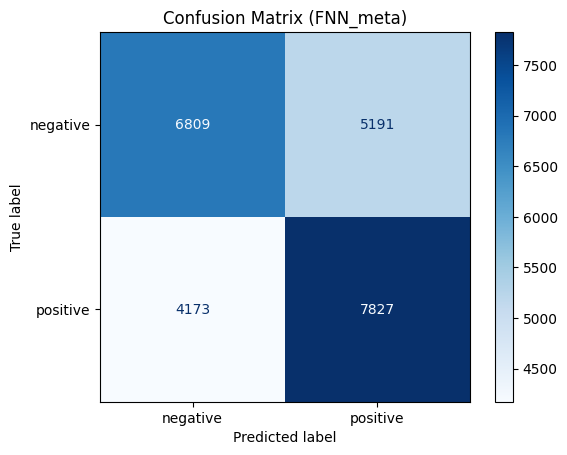


Testing FNN model: FNN_text


750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 391us/step

Classification Report (FNN_text):
              precision    recall  f1-score   support

    negative       0.87      0.88      0.88     12000
    positive       0.88      0.87      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



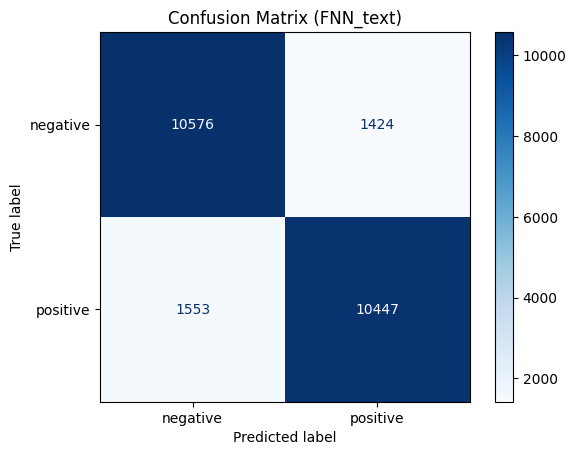


Testing FNN model: FNN_combined


750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 357us/step

Classification Report (FNN_combined):
              precision    recall  f1-score   support

    negative       0.89      0.87      0.88     12000
    positive       0.87      0.89      0.88     12000

    accuracy                           0.88     24000
   macro avg       0.88      0.88      0.88     24000
weighted avg       0.88      0.88      0.88     24000



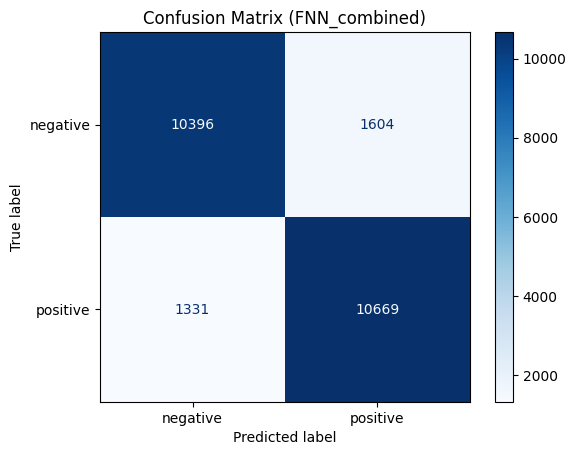

In [ ]:
# Convert all test matrices to dense
X_meta_test_dense     = X_meta_test.toarray()
X_text_test_dense     = X_text_test.toarray()
X_combined_test_dense = X_combined_test.toarray()

# Define the test sets for each FNN variant
fnn_test_configs = {
    "meta": {
        "model_path": "saved_fnn_models/FNN_meta.h5",
        "X_test": X_meta_test_dense
    },
    "text": {
        "model_path": "saved_fnn_models/FNN_text.h5",
        "X_test": X_text_test_dense
    },
    "combined": {
        "model_path": "saved_fnn_models/FNN_combined.h5",
        "X_test": X_combined_test_dense
    }
}

# Run the test loop for each saved model
for name, cfg in fnn_test_configs.items():
    test_fnn_model(
        name=f"FNN_{name}",
        model_path=cfg["model_path"],
        X_test=cfg["X_test"],
        y_test_enc=y_test_enc,
        encoder=label_encoder
    )


## Word2Vec + FNN Model

Word2Vec model trained in 25.88 seconds


/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_9 (Dense)                 │ (None, 256)            │        25,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 68,674 (268.26 KB)

 Trainable params: 67,906 (265.26 KB)

 Non-trainable params: 768 (3.00 KB)

Epoch 1/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7247 - loss: 0.6601 - val_accuracy: 0.8550 - val_loss: 0.3367
Epoch 2/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8296 - loss: 0.4013 - val_accuracy: 0.8646 - val_loss: 0.3173
Epoch 3/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 962us/step - accuracy: 0.8422 - loss: 0.3708 - val_accuracy: 0.8675 - val_loss: 0.3098
Epoch 4/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 972us/step - accuracy: 0.8499 - loss: 0.3508 - val_accuracy: 0.8699 - val_loss: 0.3055
Epoch 5/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 987us/step - accuracy: 0.8544 - loss: 0.3376 - val_accuracy: 0.8706 - val_loss: 0.3013
Epoch 6/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 989us/step - accuracy: 0.8590 - loss: 0.3328 - val_accuracy: 0.8705 - val_loss: 0.3023
Epoch 7/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8635 - loss: 0.3220 - val_accuracy: 0.8695 - val_loss: 0.2999
Epoch 8/20
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8629 - loss: 0

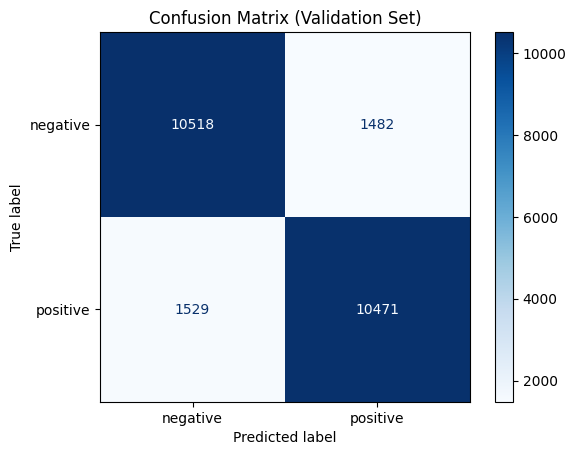

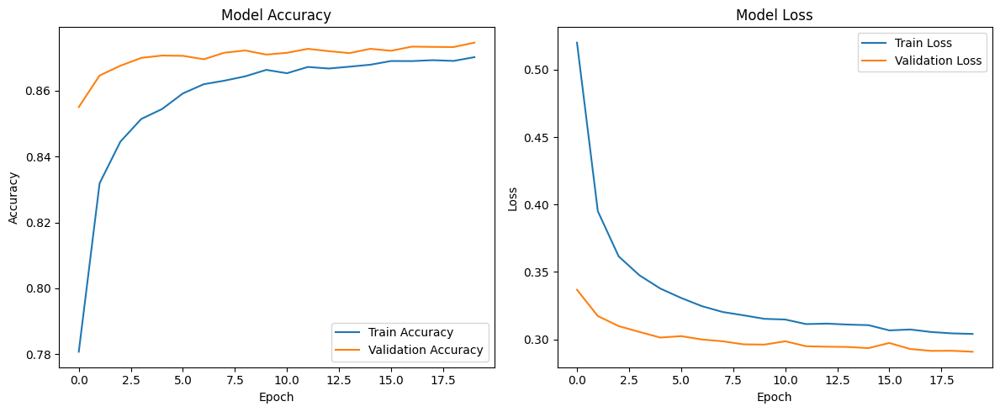

In [ ]:
import time
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

# Tokenization for Word2Vec
train_tokens = train_df['clean_text_ML'].apply(word_tokenize)
val_tokens   = val_df['clean_text_ML'].apply(word_tokenize)
test_tokens  = test_df['clean_text_ML'].apply(word_tokenize)

# Train Word2Vec model
start_time = time.time()

w2v_model = Word2Vec(
    sentences=train_tokens,
    vector_size=100,
    window=5,
    min_count=2,
    workers=4,
    sg=1,
    seed=42
)

print(f"Word2Vec model trained in {time.time() - start_time:.2f} seconds")

# Convert sentence to mean Word2Vec vectors
def get_mean_vec(tokens, model, dim=100):
    vec = np.zeros(dim)
    count = 0
    for word in tokens:
        if word in model.wv:
            vec += model.wv[word]
            count += 1
    return vec / count if count > 0 else vec

X_train_vec = np.array([get_mean_vec(t, w2v_model) for t in train_tokens])
X_val_vec   = np.array([get_mean_vec(t, w2v_model) for t in val_tokens])
X_test_vec  = np.array([get_mean_vec(t, w2v_model) for t in test_tokens])

# Build Feedforward Neural Network
fnn_model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train_vec.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(2, activation='softmax')  # Binary classification
])

fnn_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

fnn_model.summary()

# Train Model with Early Stopping
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

start_time = time.time()
history = fnn_model.fit(
    X_train_vec, y_train_enc,
    validation_data=(X_val_vec, y_val_enc),
    epochs=20,
    batch_size=64,
    callbacks=[early_stop],
    verbose=1
)

print(f"\n Trining completed in {time.time() - start_time:.2f} seconds.")

# Evaluate on Validation Set
y_val_probs = fnn_model.predict(X_val_vec)
y_val_pred  = np.argmax(y_val_probs, axis=1)
y_val_true  = np.argmax(y_val_enc, axis=1)

print(" Classification Report (Validation Set):")
print(classification_report(y_val_true, y_val_pred, target_names=label_encoder.classes_))

cm = confusion_matrix(y_val_true, y_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Validation Set)")
plt.show()

# Plot Accuracy and Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


## Save Model

In [ ]:
fnn_model.save("saved_fnn_models/FNN_Word2Vec.h5")

## Test Model

750/750 ━━━━━━━━━━━━━━━━━━━━ 0s 265us/step
              precision    recall  f1-score   support

    negative       0.87      0.88      0.87     12000
    positive       0.88      0.87      0.87     12000

    accuracy                           0.87     24000
   macro avg       0.87      0.87      0.87     24000
weighted avg       0.87      0.87      0.87     24000



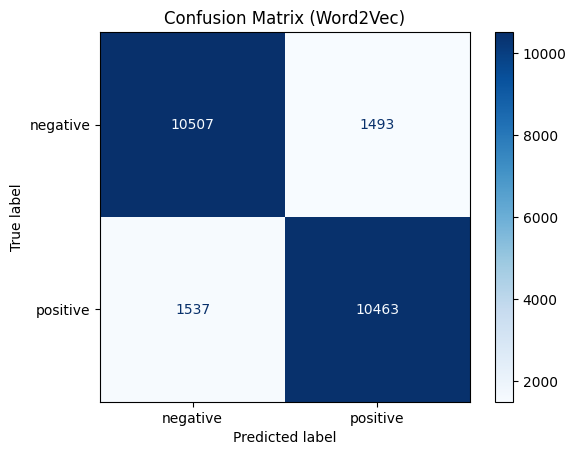

In [ ]:
from tensorflow.keras.models import load_model

# Load trained model
model = load_model("saved_fnn_models/FNN_Word2Vec.h5")

# Predict
y_probs = model.predict(X_test_vec)
y_pred = np.argmax(y_probs, axis=1)
y_true = np.argmax(y_test_enc, axis=1)

# Evaluate
print(classification_report(y_true, y_pred, target_names=label_encoder.classes_))

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.classes_)
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (Word2Vec)")
plt.show()


## DistilBERT Model

##  DistilBERT Data Preprocessing

In [ ]:
import tensorflow as tf
from transformers import DistilBertTokenizer
from sklearn.preprocessing import LabelEncoder

# Configuration parameters
max_len = 128
batch_size = 16

# Initialize tokenizer
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Encode sentiment labels for train, val, and test sets
label_encoder = LabelEncoder()
train_labels = label_encoder.fit_transform(train_df['sentiment'])
val_labels = label_encoder.transform(val_df['sentiment'])
test_labels = label_encoder.transform(test_df['sentiment'])

# Function to tokenize texts and prepare TensorFlow datasets (simple, no shuffle/cache)
def encode(texts, labels):
    encodings = tokenizer(
        list(texts),
        max_length=max_len,
        truncation=True,
        padding='max_length',
        return_tensors='tf'
    )
    dataset = tf.data.Dataset.from_tensor_slices((
        {
            'input_ids': encodings['input_ids'],
            'attention_mask': encodings['attention_mask']
        },
        labels
    ))
    return dataset.batch(batch_size)

# Prepare datasets
train_dataset = encode(train_df['clean_text_DL'], train_labels)
val_dataset = encode(val_df['clean_text_DL'], val_labels)
test_dataset = encode(test_df['clean_text_DL'], test_labels)


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

##  DistilBERT Model Building

In [ ]:
from transformers import TFDistilBertForSequenceClassification
from tensorflow.keras.losses import SparseCategoricalCrossentropy
import tensorflow as tf

num_labels = 2
learning_rate = 2e-5

# Load pretrained DistilBERT with classification head
model = TFDistilBertForSequenceClassification.from_pretrained(
    'distilbert-base-uncased',
    num_labels=num_labels,
)

# Compile the model with optimizer, loss and metrics
optimizer = tf.optimizers.Adam(learning_rate=learning_rate)
loss = SparseCategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])


model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFDistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_transform.bias', 'vocab_transform.weight']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFDistilBertForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['pre_classifier.weight', 'pre_classifier.bias', 'classifier.weight', 'classifier.bias']
You should 

## DistilBERT Training and Validation

Epoch 1/3
4500/4500 [==============================] - 4529s 1s/step - loss: 0.2647 - accuracy: 0.8889 - val_loss: 0.2328 - val_accuracy: 0.9044
Epoch 2/3
4500/4500 [==============================] - 4479s 995ms/step - loss: 0.1853 - accuracy: 0.9262 - val_loss: 0.2449 - val_accuracy: 0.9023
Epoch 3/3
4500/4500 [==============================] - 4496s 999ms/step - loss: 0.1232 - accuracy: 0.9531 - val_loss: 0.3024 - val_accuracy: 0.8977

Training completed in 13504.62 seconds.
1500/1500 [==============================] - 439s 292ms/step

Classification Report:
              precision    recall  f1-score   support

    negative       0.89      0.91      0.90     12000
    positive       0.90      0.89      0.90     12000

    accuracy                           0.90     24000
   macro avg       0.90      0.90      0.90     24000
weighted avg       0.90      0.90      0.90     24000



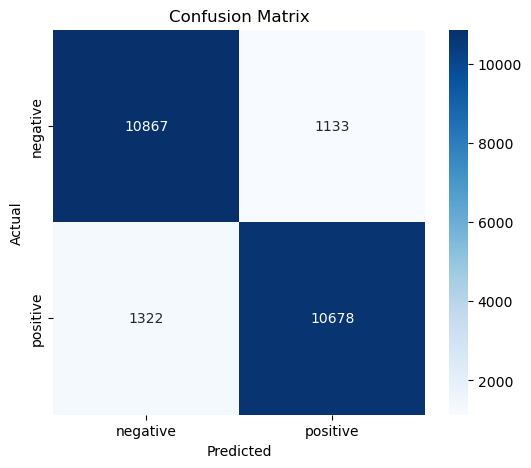

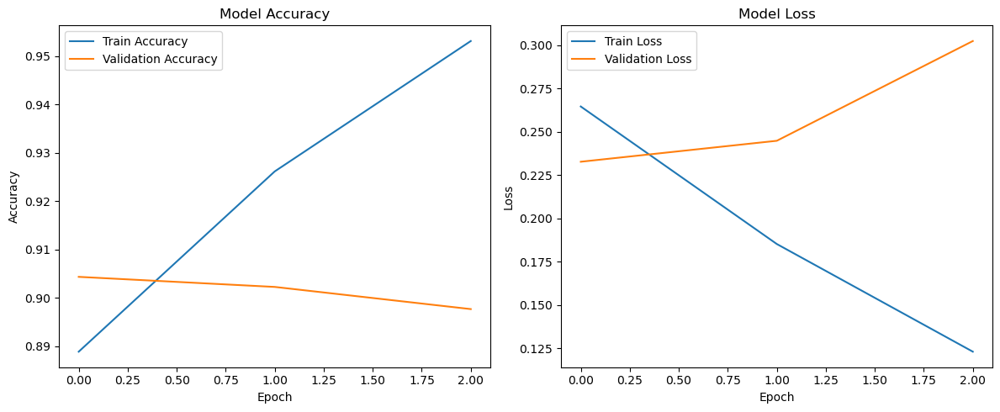

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

# Start training timer
start_time = time.time()

# Train the model with validation data
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=3
)

end_time = time.time()
print(f"\nTraining completed in {end_time - start_time:.2f} seconds.")

# Predict logits on validation dataset
val_preds_logits = model.predict(val_dataset).logits
val_preds = np.argmax(val_preds_logits, axis=1)

# Extract true labels from validation dataset
val_true = np.concatenate([y.numpy() for _, y in val_dataset], axis=0)

# Print classification report
print("\nClassification Report:")
print(classification_report(val_true, val_preds, target_names=label_encoder.classes_))

# Plot confusion matrix
cm = confusion_matrix(val_true, val_preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Plot training & validation accuracy and loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


## Save Model

In [ ]:
# Save the fine-tuned model and tokenizer for later use
model.save_pretrained('./saved_distilbert_model')
tokenizer.save_pretrained('./saved_distilbert_model')

print("Model and tokenizer saved successfully.")


Model and tokenizer saved successfully.


## Test Model

Some layers from the model checkpoint at ./saved_distilbert_model were not used when initializing TFDistilBertForSequenceClassification: ['dropout_19']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at ./saved_distilbert_model and are newly initialized: ['dropout_39']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


1500/1500 [==============================] - 438s 290ms/step - loss: 0.2982 - accuracy: 0.8971
Test Loss: 0.2982
Test Accuracy: 0.8971
1500/1500 [==============================] - 437s 290ms/step
              precision    recall  f1-score   support

    negative       0.89      0.91      0.90     12000
    positive       0.91      0.89      0.90     12000

    accuracy                           0.90     24000
   macro avg       0.90      0.90      0.90     24000
weighted avg       0.90      0.90      0.90     24000



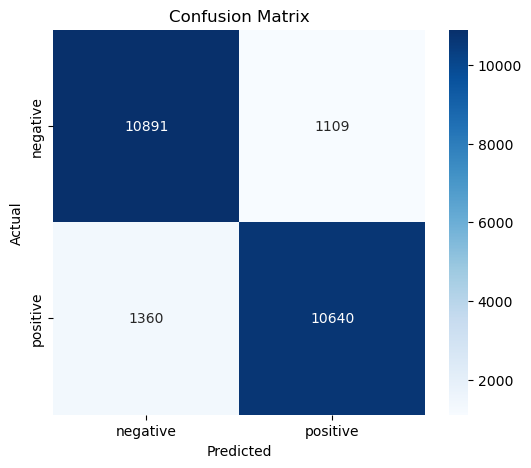

In [ ]:
from transformers import TFDistilBertForSequenceClassification, DistilBertTokenizer
from tensorflow.keras.losses import SparseCategoricalCrossentropy
import tensorflow as tf
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load model and tokenizer from saved directory
model_loaded = TFDistilBertForSequenceClassification.from_pretrained('./saved_distilbert_model')
tokenizer_loaded = DistilBertTokenizer.from_pretrained('./saved_distilbert_model')

# Compile model (necessary for evaluate and predict)
optimizer = tf.optimizers.Adam(learning_rate=2e-5)
loss = SparseCategoricalCrossentropy(from_logits=True)
model_loaded.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])

# Prepare test dataset similarly as before
encodings = tokenizer_loaded(
    list(test_df['clean_text_DL']),
    max_length=128,
    truncation=True,
    padding='max_length',
    return_tensors='tf'
)

test_labels = label_encoder.transform(test_df['sentiment'])

test_dataset = tf.data.Dataset.from_tensor_slices((
    {
        'input_ids': encodings['input_ids'],
        'attention_mask': encodings['attention_mask']
    },
    test_labels
)).batch(16)

# Evaluate the model on test data
eval_result = model_loaded.evaluate(test_dataset)
print(f"Test Loss: {eval_result[0]:.4f}")
print(f"Test Accuracy: {eval_result[1]:.4f}")

# Predict on test dataset
preds_logits = model_loaded.predict(test_dataset).logits
preds = np.argmax(preds_logits, axis=1)

# Print classification report and confusion matrix
print(classification_report(test_labels, preds, target_names=label_encoder.classes_))

cm = confusion_matrix(test_labels, preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()



## BERTopic

In [ ]:
# ! pip install bertopic sentence-transformers matplotlib gensim
# ! pip install nbformat

In [ ]:
from bertopic import BERTopic
import pandas as pd

df_cleaned = pd.read_csv('yelp_preprocessed.csv')
docs = df_cleaned['clean_text_DL']
classes = df_cleaned['sentiment']

topic_model = BERTopic(embedding_model='all-MiniLM-L6-v2')

topics, probs = topic_model.fit_transform(docs)

df_cleaned['Topic'] = topics

df_cleaned.to_csv('topics.csv', index= False)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [ ]:
# Calculate two metrics: Topic coherence and Topic diversity
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

topics_words = topic_model.get_topics()
top_n_words = [
    [word for word, _ in topic_model.get_topic(topic)[:10]]
    for topic in topic_model.get_topics().keys()
    if topic_model.get_topic(topic) is not None
]

tokenized_docs = [doc.split() for doc in docs]

dictionary = Dictionary(tokenized_docs)
coherence_model = CoherenceModel(
    topics=top_n_words,
    texts=tokenized_docs,
    dictionary=dictionary,
    coherence='c_v'
)
topic_coherence = coherence_model.get_coherence()

def compute_topic_diversity(top_n_words):
    unique_words = set([word for topic in top_n_words for word in topic])
    total_words = sum([len(topic) for topic in top_n_words])
    return len(unique_words) / total_words

topic_diversity = compute_topic_diversity(top_n_words)

print(f"Topic Coherence (C_v): {topic_coherence:.4f}")
print(f"Topic Diversity: {topic_diversity:.4f}")


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

Topic Coherence (C_v): 0.4183
Topic Diversity: 0.6069


In [ ]:
topic_info = topic_model.get_topic_info()
topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,54319,-1_was_we_the_were,"[was, we, the, were, and, our, to, it, with, had]","[First off, let me say that I don't normally g..."
1,0,6706,0_pizza_crust_pie_pizzas,"[pizza, crust, pie, pizzas, slice, delivery, p...",[I've had Rustica many times. Some times for l...
2,1,3574,1_cheesesteak_pat_geno_steak,"[cheesesteak, pat, geno, steak, cheesesteaks, ...","[Only been once, came from out-of-town. Have t..."
3,2,3359,2_sushi_roll_rolls_tuna,"[sushi, roll, rolls, tuna, sashimi, tempura, j...","[Love Bleu sushi, great sushi, with great spec..."
4,3,2512,3_philly_philadelphia_in_great,"[philly, philadelphia, in, great, place, best,...",[I searched through several Yelp reviews to fi...
...,...,...,...,...,...
502,501,10,501_calamari_calamaries_mark_us,"[calamari, calamaries, mark, us, brought, past...",[My friend and I were long overdue for a dinne...
503,502,10,502_salmon_raiding_wife_yas,"[salmon, raiding, wife, yas, diabla, bough, co...",[Overall a huge disappointment! Having eaten h...
504,503,10,503_salmon_debbie_landing_spunktown,"[salmon, debbie, landing, spunktown, lunchtime...",[The Landing is ok. It's really great for rive...
505,504,10,504_jones_empire_martini_cocktail,"[jones, empire, martini, cocktail, bourbon, co...","[First thing- Dessert was the best, drink was ..."


In [ ]:
topic_info.to_csv("topic_info.csv", index=False)

In [ ]:
topic_model.get_topic(0)

[('pizza', 0.02021199328899502),
 ('crust', 0.006916156437272659),
 ('pie', 0.0054099202062202045),
 ('pizzas', 0.0053353830257326955),
 ('slice', 0.004746277372752728),
 ('delivery', 0.003552641710100193),
 ('pepperoni', 0.003346103218229633),
 ('slices', 0.0032995563646750973),
 ('thin', 0.0028758823640513036),
 ('cheese', 0.0027946844332520453)]

In [ ]:
topic_model.get_representative_docs(0)

["I've had Rustica many times. Some times for lunch, a snack, dinner, late night eating and it is always awesome. For me, it's the crust. It's the perfect amount of crunchy for my pizza crust needs. They have a super long pizza menu that includes the classic favorites but also has some over the top gourmet pizza. It has any type of pizza for any type of mood. The pizza winner for me has to be the buffalo chicken pizza. It's spicy but totally awesome with a side of blue cheese. It might be the best i've ever had!",
 "Driving through Langhorne around 4pm and needed a snack to tide me over until a late dinner. So, I decided to get a slice at Brothers. I've never been there, even though I've lived in the area forever. It has a nice sized parking lot and the interior is a step above most pizza joints. Has high-top seating in the front room and what looks like a dining room on the adjoining room. A dozen or so pies were on offer for by the slice orders. All looked like they were made within 

In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_barchart()

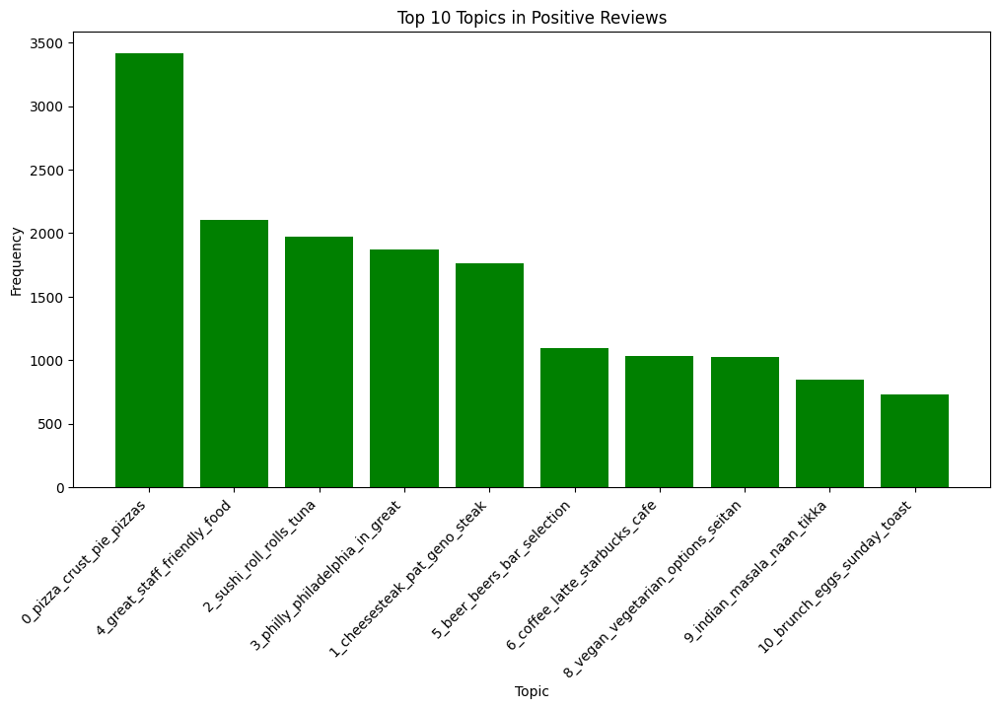

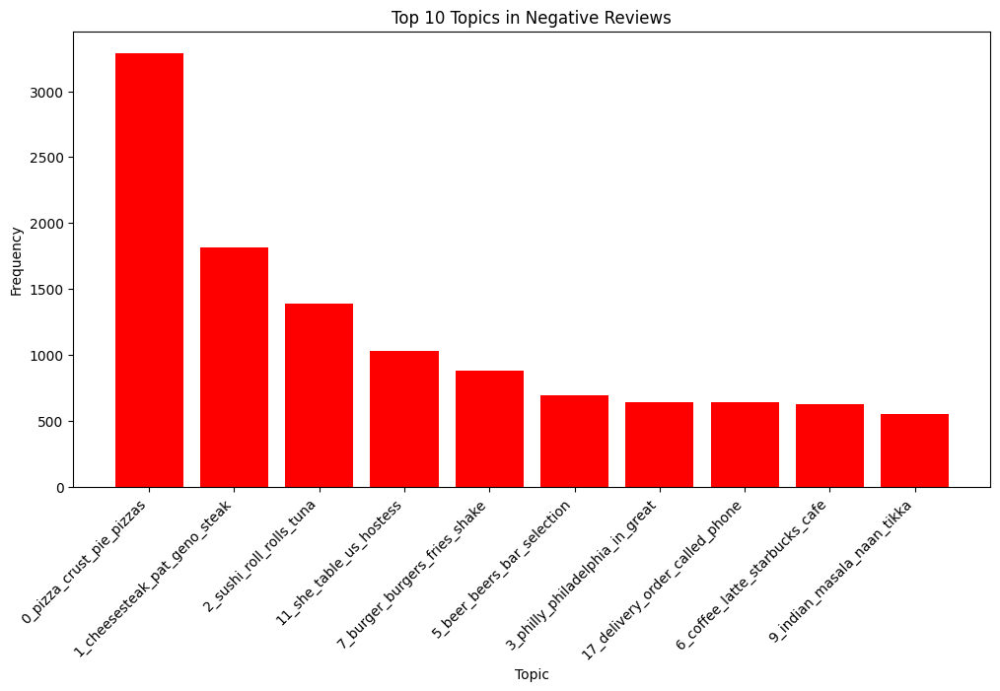


Top 10 Topics in Positive Reviews:
   Topic  Frequency                              Words  \
0      0       3416           0_pizza_crust_pie_pizzas   
1      4       2107        4_great_staff_friendly_food   
2      2       1973            2_sushi_roll_rolls_tuna   
3      3       1867     3_philly_philadelphia_in_great   
4      1       1761       1_cheesesteak_pat_geno_steak   
5      5       1097         5_beer_beers_bar_selection   
6      6       1029      6_coffee_latte_starbucks_cafe   
7      8       1021  8_vegan_vegetarian_options_seitan   
8      9        844         9_indian_masala_naan_tikka   
9     10        733        10_brunch_eggs_sunday_toast   

                                      Representation  \
0  ['pizza', 'crust', 'pie', 'pizzas', 'slice', '...   
1  ['great', 'staff', 'friendly', 'food', 'love',...   
2  ['sushi', 'roll', 'rolls', 'tuna', 'sashimi', ...   
3  ['philly', 'philadelphia', 'in', 'great', 'pla...   
4  ['cheesesteak', 'pat', 'geno', 'steak', 'c

In [ ]:
import matplotlib.pyplot as plt

df_topics = pd.read_csv('topics.csv')
df_topics_info = pd.read_csv('topic_info.csv')
df_topics = df_topics[df_topics['Topic'] != -1]

positive_topics = (
    df_topics[df_topics['sentiment'] == 'positive']
    .groupby('Topic')
    .size()
    .nlargest(10)
    .reset_index(name='Frequency')
)
positive_topics['Words'] = positive_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Name'])
positive_topics['Representation'] = positive_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Representation'])
positive_topics['Representative_Docs'] = positive_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Representative_Docs'])

negative_topics = (
    df_topics[df_topics['sentiment'] == 'negative']
    .groupby('Topic')
    .size()
    .nlargest(10)
    .reset_index(name='Frequency')
)
negative_topics['Words'] = negative_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Name'])
negative_topics['Representation'] = negative_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Representation'])
negative_topics['Representative_Docs'] = negative_topics['Topic'].map(
    df_topics_info.set_index('Topic')['Representative_Docs'])

plt.figure(figsize=(12, 6))
plt.bar(positive_topics['Words'].astype(str), positive_topics['Frequency'], color='green')
plt.xlabel('Topic')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')
plt.title('Top 10 Topics in Positive Reviews')
plt.savefig('positive_neutral_topics.png')
plt.show()


plt.figure(figsize=(12, 6))
plt.bar(negative_topics['Words'].astype(str), negative_topics['Frequency'], color='red')
plt.xlabel('Topic')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Frequency')
plt.title('Top 10 Topics in Negative Reviews')
plt.savefig('negative_topics.png')
plt.show()


print("\nTop 10 Topics in Positive Reviews:")
print(positive_topics[['Topic', 'Frequency','Words','Representation','Representative_Docs']])

print("Top 10 Topics in Negative Reviews:")
print(negative_topics[['Topic', 'Frequency', 'Words','Representation','Representative_Docs']])



Cosine Distance Matrix antar Top 10 Topics:
              0             3             1             2             5   \
0   1.192093e-07  2.080455e-01  1.736320e-01  2.009499e-01  9.752381e-02   
3   2.080455e-01 -2.384186e-07  3.017244e-01  3.824716e-01  2.703557e-01   
1   1.736320e-01  3.017244e-01 -2.384186e-07  2.139876e-01  2.587947e-01   
2   2.009499e-01  3.824716e-01  2.139876e-01  2.384186e-07  2.925421e-01   
5   9.752381e-02  2.703557e-01  2.587947e-01  2.925421e-01  1.192093e-07   
11  1.554661e-01  3.300833e-01  3.626995e-01  3.382585e-01  1.972145e-01   
7   2.544356e-01  4.469036e-01  3.706038e-01  4.396000e-01  2.304486e-01   
9   1.861651e-01  3.246315e-01  2.948579e-01  2.391746e-01  2.289951e-01   
8   1.609321e-01  3.557018e-01  3.039030e-01  2.584305e-01  2.582842e-01   
10  1.981857e-01  2.480928e-01  3.927981e-01  3.690008e-01  2.351025e-01   

              11            7             9             8             10  
0   1.554661e-01  2.544356e-01  1.861651e-01

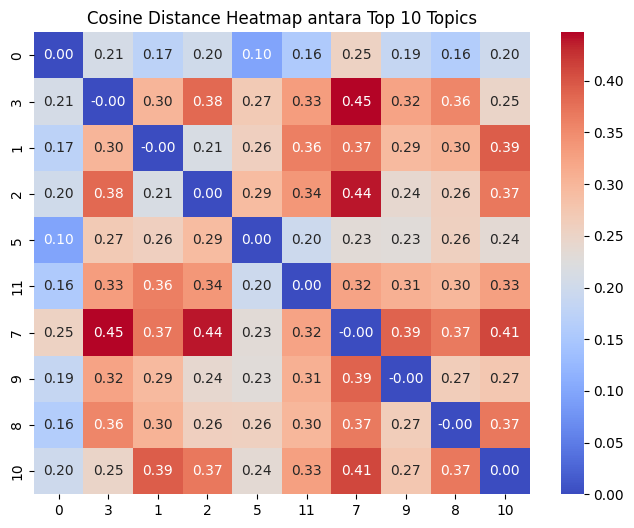

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity

# Example list of top 10 topics from your data; replace with your actual topic indices
top_10_topics = [0, 3, 1, 2, 5, 11, 7, 9, 8, 10]

# Extract all topic embeddings from the topic model
all_embeddings = np.array(topic_model.topic_embeddings_)

# Select embeddings corresponding to the top 10 topics
top_10_embeddings = all_embeddings[top_10_topics]

# Calculate cosine similarity matrix between the top 10 topic embeddings
sim_matrix = cosine_similarity(top_10_embeddings)

# Optionally, compute cosine distance as 1 - similarity
dist_matrix = 1 - sim_matrix

# Create a DataFrame for easier readability of the distance matrix
dist_df = pd.DataFrame(dist_matrix, index=top_10_topics, columns=top_10_topics)

print("Cosine Distance Matrix among Top 10 Topics:")
print(dist_df)

# Visualize the distance matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(dist_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Cosine Distance Heatmap between Top 10 Topics")
plt.show()
